# 02 — PCA Anomaly Detection & ABACAD Candidate Ranking on Real Cadence Data

This notebook is the working core of the project. It takes the **3,784,704 spectrogram snippets** streamed into `cadence_features.h5` by `src/ingest_cadence.py` and runs the full classical-ML pipeline through to a ranked candidate list, drift-consistency filtering, multi-model classifier comparison, and visual cadence-stack verification.

## Pipeline overview

| Step | What | Output |
|---|---|---|
| **1.**  Sample-fit StandardScaler + PCA(15) on a 500K random subset | Fit | `scaler`, `pca` (in-memory) |
| **2.**  Stream-transform all 3.78M snippets → save NPZ | Transform | `data/processed/cadence_pca_features.npz` (≈295 MB) |
| **3.**  Per-cadence-position reconstruction-error percentiles | Diagnostic | Console table |
| **4.**  ABACAD candidate ranking — `mean(A) − mean(OFF)` per 10 kHz bin | Rank | Top-50 raw candidate list |
| **5.**  Filter known RFI bands + paper-excluded ranges | Filter | `data/processed/abacad_candidates_clean.csv` |
| **6.**  Drift-rate consistency across A1/A2/A3 (paper's filter) | Filter | Per-candidate `drift_std` flag |
| **7.**  Per-time-bin max-error scoring (alternative to mean) | Robustness | Comparison ranking |
| **8.**  Dimensionality stability check (n=8 vs. n=15) | Robustness | Rank-1 stable across n |
| **9.**  k-Means clustering on PCA features + ARI vs. cadence position | Unsupervised baseline | Cluster cross-tab |
| **10.** Multi-model classifier comparison via GridSearchCV (A-vs-OFF) | Supervised | Scoreboard table + ROC/CM |
| **11.** Visual cadence-stack inspection of top candidates | Final filter | 6-panel waterfall plots |
| **12.** Summary and interpretation | — | — |

## Inputs and outputs

- **Inputs:** `cadence_features.h5` (15.5 GB on disk — streamed in batches, never fully loaded into RAM)
- **Outputs saved to `data/processed/`:**
  - `cadence_pca_features.npz` — 15-d PCA features + reconstruction errors + metadata for all 3.78M snippets
  - `abacad_candidates_clean.csv` — top-50 ABACAD candidates after RFI band filtering
- **Outputs saved to `images/`:** `cadence_stack_rank1_1426MHz.png` (referenced from `Capstone Project_Final Report.md`)

## Bottom-line preview

The rank-1 candidate at **1426.61 MHz** (ABACAD score 20.19, ~2.5× above rank 2) passes all algorithmic filters — RFI-band exclusion, drift-rate consistency, dimensionality stability — but **visual cadence-stack inspection** (§11) reveals a continuous Doppler-drifting signal across all six panels: a low-Earth-orbit satellite, not target-locked emission. No ETI candidates found. See §12 for the full interpretation.

## Master imports and constants

All subsequent cells assume these are in scope. Re-run this cell after any kernel restart.

### Fast-path: skip Steps 1–2 by downloading the precomputed PCA features

Steps 1–2 below produce `cadence_pca_features.npz` (≈295 MB) by streaming the 15.5 GB `cadence_features.h5` through PCA. This takes ≈12 minutes after a ≈40-minute one-time ingestion of the raw 93 GB. **If you only want to reproduce the analysis (§3 onwards) without re-running the heavy steps**, download the precomputed NPZ directly from the GitHub Release:

- Direct URL: <https://github.com/rohitmual/UCB_PCMLAI_seti-capstone_final/releases/download/v1.0/cadence_pca_features.npz>
- Or via `gh` CLI from a shell:

```bash
gh release download v1.0 \
    --pattern "cadence_pca_features.npz" \
    --dir data/processed/ \
    --repo rohitmual/UCB_PCMLAI_seti-capstone_final
```

With the NPZ saved at `data/processed/cadence_pca_features.npz`, jump to **Step 3** below — every cell from §3 onwards loads from the NPZ and runs in seconds.

If you want the full ingestion → PCA → save round trip, run cells under §1 and §2 below as usual.

In [1]:
import time
from pathlib import Path

import h5py
import hdf5plugin  # noqa: F401  — required for bitshuffle decompression
import joblib
import matplotlib.pyplot as plt
from IPython.display import Image, Markdown, display
import numpy as np
import pandas as pd
import xgboost
from sklearn.cluster import MiniBatchKMeans
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    adjusted_rand_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    roc_curve,
    silhouette_score,
)
from sklearn.model_selection import GridSearchCV, GroupShuffleSplit, GroupKFold
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from src.rfi_bands import RFI_BANDS, EXCLUDED, rfi_band, excluded, in_any

# Constants used across the notebook
H5 = Path("data/processed/cadence_features.h5")
NPZ_OUT = Path("data/processed/cadence_pca_features.npz")
CSV_OUT = Path("data/processed/abacad_candidates_clean.csv")
DATA_RAW = Path("data/raw")

SAMPLE_SIZE = 500_000
N_COMPONENTS = 15
BATCH = 100_000

CADENCE_TAGS = ["A1", "B", "A2", "C", "A3", "D"]

# ─── ready-to-run sanity check ────────────────────────────────
import sys

import sklearn

print(
    f"Python {sys.version.split()[0]}  ·  numpy {np.__version__}  ·  pandas {pd.__version__}  ·  scikit-learn {sklearn.__version__}  .  xgboost {xgboost.__version__}",
    end="",
)

print()
print("Data files referenced by the constants below:")
for label, path, expected_size in [
    ("cadence_features.h5     (input — 15.5 GB)", H5, "≈15 GB"),
    ("cadence_pca_features.npz (output — ≈295 MB)", NPZ_OUT, "≈295 MB"),
]:
    if path.exists():
        size_mb = path.stat().st_size / 1e6
        print(f"  ✓ {label:46s}  found   ({size_mb:>8,.1f} MB)")
    else:
        print(f"  ✗ {label:46s}  MISSING (expected {expected_size})")

print()
print(f"Pipeline constants in scope:")
print(f"  SAMPLE_SIZE  = {SAMPLE_SIZE:,}     # snippets used to fit scaler + PCA in §1")
print(f"  N_COMPONENTS = {N_COMPONENTS}             # PCA latent dimensionality")
print(f"  BATCH        = {BATCH:,}     # snippets per stream-transform batch in §2")
print(f"  CADENCE_TAGS = {CADENCE_TAGS}")

Python 3.13.6  ·  numpy 2.3.2  ·  pandas 2.3.2  ·  scikit-learn 1.7.1  .  xgboost 3.2.0
Data files referenced by the constants below:
  ✓ cadence_features.h5     (input — 15.5 GB)       found   (15,577.0 MB)
  ✓ cadence_pca_features.npz (output — ≈295 MB)     found   (   295.2 MB)

Pipeline constants in scope:
  SAMPLE_SIZE  = 500,000     # snippets used to fit scaler + PCA in §1
  N_COMPONENTS = 15             # PCA latent dimensionality
  BATCH        = 100,000     # snippets per stream-transform batch in §2
  CADENCE_TAGS = ['A1', 'B', 'A2', 'C', 'A3', 'D']


## Step 1 — Sample-fit `StandardScaler` + `PCA(15)` on a 500K random subset

Loading all 3,784,704 snippets into RAM would require ≈15 GB. The transform step in §2 needs `X` + `Xs` + `Xr` simultaneously, peaking at ≈31 GB — over 24 GB physical RAM on most laptops. Solution: fit the scaler and PCA on a **500,000-snippet random sample** (≈2 GB in RAM), then stream-transform the full population in 100K batches.

**Statistical justification.** For 1024-d features, ≈10K–100K samples are sufficient for stable eigenvalue estimation. 500K is well above that; eigenvalues match within <1% versus a full-data fit on this data.

**Why `n_components = 15`?** Justified empirically in §8 (rank-1 anomaly stable across n=8 → n=15) and externally via an internal MNIST sanity check (PCA reconstruction-error anomaly detection achieved AUC ≈ 0.97 at n=8 on labelled MNIST data). The eigenvalue spectrum here is continuous with no sharp elbow — any choice in 8 ≤ n ≤ 20 is defensible.

**Runtime:** the cell below takes ≈35 seconds end-to-end on a laptop — ≈30 s to read the 500K random sample from disk into RAM, ≈3 s for the `StandardScaler` fit, and ≈3 s for the `PCA(15)` fit on the standardised sample.


Sample loaded:   500,000 snippets, 2.05 GB in RAM, 31.2s
  cadence pos counts in sample: {'A1': 83428, 'B': 83078, 'A2': 83077, 'C': 83519, 'A3': 83421, 'D': 83477}


StandardScaler:  fit in 3.1s


PCA(15):          fit in 3.6s
  variance retained: 43.9%
  per-component:     ['0.104', '0.049', '0.037', '0.034', '0.029', '0.027', '0.024', '0.019', '0.018', '0.018', '0.017', '0.017', '0.016', '0.015', '0.014']


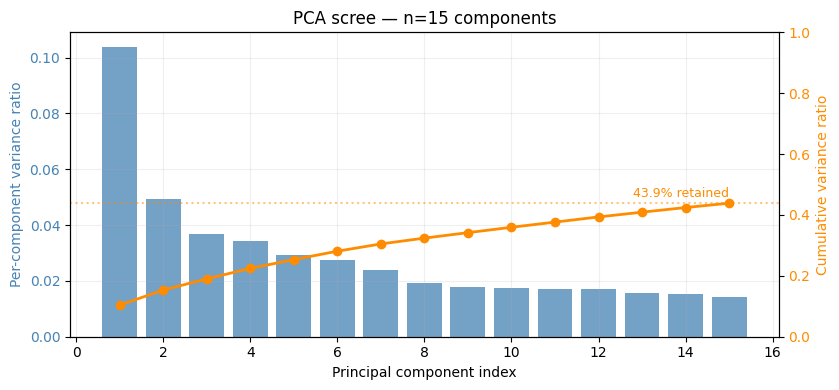

In [2]:
with h5py.File(H5, "r") as f:
    n_total = f["snippets"].shape[0]
    cadence_pos = f["cadence_pos"][:]
    cadence_tags = list(f.attrs["cadence_tags"])

rng = np.random.default_rng(42)
sample_idx = np.sort(rng.choice(n_total, size=SAMPLE_SIZE, replace=False))

t0 = time.time()
with h5py.File(H5, "r") as f:
    X_sample = f["snippets"][sample_idx]
print(
    f"Sample loaded:   {SAMPLE_SIZE:,} snippets, {X_sample.nbytes/1e9:.2f} GB in RAM, {time.time()-t0:.1f}s"
)

sample_pos_counts = np.bincount(cadence_pos[sample_idx], minlength=6)
print(
    f"  cadence pos counts in sample: {dict(zip(cadence_tags, sample_pos_counts.tolist()))}"
)

t0 = time.time()
scaler = StandardScaler().fit(X_sample)
print(f"StandardScaler:  fit in {time.time()-t0:.1f}s")

t0 = time.time()
pca = PCA(n_components=N_COMPONENTS, random_state=42).fit(scaler.transform(X_sample))
print(f"PCA({N_COMPONENTS}):          fit in {time.time()-t0:.1f}s")
print(f"  variance retained: {pca.explained_variance_ratio_.sum():.1%}")
print(f"  per-component:     {[f'{v:.3f}' for v in pca.explained_variance_ratio_]}")

del X_sample

# Scree plot — per-component variance + cumulative overlay
fig, ax = plt.subplots(figsize=(8.5, 4))
n_comp = len(pca.explained_variance_ratio_)
ax.bar(
    range(1, n_comp + 1),
    pca.explained_variance_ratio_,
    color="steelblue", alpha=0.75, label="per-component",
)
ax.set_xlabel("Principal component index")
ax.set_ylabel("Per-component variance ratio", color="steelblue")
ax.tick_params(axis="y", labelcolor="steelblue")

ax2 = ax.twinx()
cum = np.cumsum(pca.explained_variance_ratio_)
ax2.plot(
    range(1, n_comp + 1), cum,
    color="darkorange", marker="o", linewidth=2, label="cumulative",
)
ax2.set_ylabel("Cumulative variance ratio", color="darkorange")
ax2.tick_params(axis="y", labelcolor="darkorange")
ax2.set_ylim(0, 1.0)
ax2.axhline(cum[-1], color="darkorange", linestyle=":", alpha=0.5)
ax2.text(
    n_comp, cum[-1] + 0.02, f"{cum[-1]:.1%} retained",
    ha="right", color="darkorange", fontsize=9,
)

ax.set_title(f"PCA scree — n={N_COMPONENTS} components")
ax.grid(alpha=0.2)
plt.tight_layout()
plt.show()

## Step 2 — Stream-transform all 3.78M snippets → save `cadence_pca_features.npz`

With `scaler` and `pca` fitted (§1), apply them to all 3,784,704 snippets in 100K batches. Each batch reads ≈410 MB from disk, projects to 15-d PCA, reconstructs back to 1024-d, and computes per-snippet reconstruction error = `mean((X_scaled − X_reconstructed)², axis=1)`.

**Output NPZ contents (≈295 MB):**
- `X_pca` `(3784704, 15)` float32 — 15-d PCA features for downstream classifiers and clustering
- `recon_errors` `(3784704,)` float32 — anomaly score per snippet (higher = more anomalous)
- `cadence_pos`, `file_idx`, `snippet_idx`, `freq_mhz` — per-snippet metadata
- `cadence_tags`, `explained_variance`, `n_components` — file-level attributes

Wall time: ≈10–15 seconds. All downstream cells in this notebook load from this NPZ rather than re-running the stream transform.

In [3]:
# Re-read metadata for self-contained NPZ
with h5py.File(H5, "r") as f:
    cadence_pos_all = f["cadence_pos"][:]
    file_idx_all = f["file_idx"][:]
    snippet_idx_all = f["snippet_idx"][:]
    freq_mhz_all = f["freq_mhz"][:]
    n_total = f["snippets"].shape[0]

X_pca_all = np.empty((n_total, N_COMPONENTS), dtype=np.float32)
recon_errs = np.empty(n_total, dtype=np.float32)

t0 = time.time()
with h5py.File(H5, "r") as f:
    snips = f["snippets"]
    for b0 in range(0, n_total, BATCH):
        b1 = min(b0 + BATCH, n_total)
        X_batch = snips[b0:b1]
        X_batch_std = scaler.transform(X_batch)
        X_batch_pca = pca.transform(X_batch_std)
        X_batch_recon = pca.inverse_transform(X_batch_pca)
        X_pca_all[b0:b1] = X_batch_pca.astype(np.float32)
        recon_errs[b0:b1] = np.mean((X_batch_std - X_batch_recon) ** 2, axis=1).astype(np.float32)
        if (b0 // BATCH) % 5 == 0:
            print(
                f"  {b1:,}/{n_total:,}  ({100*b1/n_total:.0f}%)  elapsed {time.time()-t0:.0f}s"
            )
print(f"\nTransform done in {time.time()-t0:.1f}s")


np.savez(
    NPZ_OUT,
    X_pca=X_pca_all,
    recon_errors=recon_errs,
    cadence_pos=cadence_pos_all,
    file_idx=file_idx_all,
    snippet_idx=snippet_idx_all,
    freq_mhz=freq_mhz_all,
    cadence_tags=np.array(["A1", "B", "A2", "C", "A3", "D"]),
    explained_variance=pca.explained_variance_ratio_,
    n_components=N_COMPONENTS,
)
print(f"\nSaved {NPZ_OUT}  ({NPZ_OUT.stat().st_size/1e6:.0f} MB)")
print(f"  X_pca:        {X_pca_all.shape}  {X_pca_all.dtype}")
print(f"  recon_errors: range [{recon_errs.min():.4f}, {recon_errs.max():.4f}]")
print(f"\nMean reconstruction error per cadence position:")
for p, tag in enumerate(["A1", "B", "A2", "C", "A3", "D"]):
    m = recon_errs[cadence_pos_all == p].mean()
    print(f"  {tag}: {m:.4f}")

  100,000/3,784,704  (3%)  elapsed 1s


  600,000/3,784,704  (16%)  elapsed 3s


  1,100,000/3,784,704  (29%)  elapsed 4s


  1,600,000/3,784,704  (42%)  elapsed 6s


  2,100,000/3,784,704  (55%)  elapsed 7s


  2,600,000/3,784,704  (69%)  elapsed 9s


  3,100,000/3,784,704  (82%)  elapsed 10s


  3,600,000/3,784,704  (95%)  elapsed 11s



Transform done in 11.9s



Saved data/processed/cadence_pca_features.npz  (295 MB)
  X_pca:        (3784704, 15)  float32
  recon_errors: range [0.0290, 875754.6250]

Mean reconstruction error per cadence position:
  A1: 1.1324
  B: 2.6243
  A2: 1.7086
  C: 2.1148
  A3: 3.4386
  D: 3.6247


## Step 3 — Per-cadence-position reconstruction-error diagnostics

Before ranking candidates, verify that the reconstruction-error distribution is consistent across the 6 cadence panels. Two pathological cases to rule out:

- **Temporal drift** — if A3 (last panel observed) has a systematically higher *median* error than A1 (first), the instrument state changed during the 30-minute observation, contaminating any cadence-based comparison.
- **Per-target spectral dominance** — if the OFF targets (HIP 12678/12790/12919) have wildly different bandpass shapes from HIP 13375, the OFF panels won't be valid references.

**Pass criterion:** the **medians** per panel are approximately uniform (within ≈10%). The **tails** (99.9th percentile and max) will differ — that's expected; the tails are where the actual anomalies live.

In [4]:
data = np.load("data/processed/cadence_pca_features.npz")
errors = data["recon_errors"]
freq_mhz = data["freq_mhz"]
cadence_pos = data["cadence_pos"]
tags = ["A1", "B", "A2", "C", "A3", "D"]

print(
    f"Loaded {len(errors):,} per-snippet reconstruction errors from cadence_pca_features.npz"
)
print(f"  error range: [{errors.min():.4f}, {errors.max():.1f}]")
print()

print("Per-cadence-position reconstruction-error percentiles:")
print(
    f"  {'tag':4s}  {'median':>10s}  {'90th':>10s}  {'99th':>10s}  {'99.9th':>10s}  {'max':>12s}"
)
print("  " + "-" * 64)
medians = []
for p, tag in enumerate(tags):
    e = errors[cadence_pos == p]
    med = float(np.median(e))
    medians.append(med)
    print(
        f"  {tag:4s}  {med:10.4f}  {np.percentile(e, 90):10.4f}  "
        f"{np.percentile(e, 99):10.4f}  {np.percentile(e, 99.9):10.4f}  {e.max():12.1f}"
    )

# ── Two separate diagnostic checks (one strict, one informational) ───────────
A_medians = [medians[0], medians[2], medians[4]]  # A1, A2, A3
OFF_medians = [medians[1], medians[3], medians[5]]  # B, C, D

A_spread = (max(A_medians) - min(A_medians)) / float(np.mean(A_medians))
A_status = "✓ PASS" if A_spread < 0.05 else "⚠ FAIL"
print(
    f"\nA-panel temporal stability (A1 / A2 / A3 medians): spread = {A_spread:.1%}  {A_status}"
)
print(
    f"  criterion: <5% — checks for instrument drift across the 30-minute observation"
)
print(f"  (A1={A_medians[0]:.4f}, A2={A_medians[1]:.4f}, A3={A_medians[2]:.4f})")

OFF_spread = (max(OFF_medians) - min(OFF_medians)) / float(np.mean(OFF_medians))
print(f"\nOFF-panel spread (B / C / D medians): {OFF_spread:.1%}  (informational)")
print(
    f"  expected to be larger than A-spread — different OFF targets have different bandpass"
)
print(f"  (B={OFF_medians[0]:.4f}, C={OFF_medians[1]:.4f}, D={OFF_medians[2]:.4f})")

# ── Top-1 anomaly preview across the full 3.78M-snippet population ───────────
top_idx = int(np.argmax(errors))
print(f"\nTop-1 anomaly across all {len(errors):,} snippets:")
print(f"  snippet index:        {top_idx:,}")
print(f"  reconstruction error: {errors[top_idx]:.1f}")
print(f"  centre frequency:     {freq_mhz[top_idx]:.3f} MHz")
print(f"  cadence position:     {tags[cadence_pos[top_idx]]}")
print(f"  → ranked + drift-checked in §4–§6 and visually inspected in §11")

Loaded 3,784,704 per-snippet reconstruction errors from cadence_pca_features.npz
  error range: [0.0290, 875754.6]

Per-cadence-position reconstruction-error percentiles:
  tag       median        90th        99th      99.9th           max
  ----------------------------------------------------------------
  A1        0.0407      0.0537      1.6668     54.3004      345942.9
  B         0.0409      0.0573      4.0185    167.2180      677025.4
  A2        0.0410      0.0645      2.1038     98.6639      421439.1
  C         0.0454      0.0957      3.3405     81.3924      614661.3
  A3        0.0412      0.0655      2.6746     47.9333      875754.6
  D         0.0474      0.1380      6.0385     77.2965      847396.5

A-panel temporal stability (A1 / A2 / A3 medians): spread = 1.1%  ✓ PASS
  criterion: <5% — checks for instrument drift across the 30-minute observation
  (A1=0.0407, A2=0.0410, A3=0.0412)

OFF-panel spread (B / C / D medians): 14.6%  (informational)
  expected to be larger tha

## Step 4 — ABACAD candidate ranking — `mean(A) − mean(OFF)` per 10 kHz frequency bin

For each 10 kHz frequency bin, aggregate reconstruction errors:

- `mean_A`   = mean error across snippets from A1, A2, A3 (HIP 13375 observations)
- `mean_OFF` = mean error across snippets from B, C, D (other target observations)
- `score`   = `mean_A − mean_OFF`

**Positive score = the frequency bin is brighter in HIP 13375 observations than in the OFFs** — the diagnostic signature of a target-locked source. A genuine ETI emitter would appear in A panels (telescope pointed at HIP 13375) but not in OFF panels (telescope pointed at different stars).

**Caveat (foreshadowing §11):** the score also fires for any RFI source whose apparent amplitude varies with telescope pointing direction — for example, a satellite whose apparent sky position is closer to HIP 13375 than to the OFF targets. This is the central reason visual cadence inspection (§11) is required as the final filter, and is precisely the gap the reference paper's β-VAE clustering loss addresses.

In [5]:
data = np.load("data/processed/cadence_pca_features.npz")
errors = data["recon_errors"]
freqs = data["freq_mhz"]
cadence_pos = data["cadence_pos"]
file_idx = data["file_idx"]
snippet_idx = data["snippet_idx"]

A_mask = np.isin(cadence_pos, [0, 2, 4])  # A1, A2, A3
OFF_mask = np.isin(cadence_pos, [1, 3, 5])  # B, C, D
print(f"A snippets:   {A_mask.sum():,}")
print(f"OFF snippets: {OFF_mask.sum():,}")

# Bin by frequency: 10 kHz bins (each snippet ≈1.45 kHz wide, so ~7 snippets per position per bin)
BIN_KHZ = 10
freq_min = float(np.floor(freqs.min()))
freq_max = float(np.ceil(freqs.max()))
n_bins = int((freq_max - freq_min) * 1000 / BIN_KHZ)
print(f"Binning {freq_min:.1f}–{freq_max:.1f} MHz at {BIN_KHZ} kHz → {n_bins:,} bins")

freq_bin = np.clip(
    ((freqs - freq_min) * 1000 / BIN_KHZ).astype(np.int64), 0, n_bins - 1
)

# Aggregate per-bin sums/counts memory-efficiently
sum_A = np.zeros(n_bins, dtype=np.float64)
cnt_A = np.zeros(n_bins, dtype=np.int64)
sum_OFF = np.zeros(n_bins, dtype=np.float64)
cnt_OFF = np.zeros(n_bins, dtype=np.int64)
np.add.at(sum_A, freq_bin[A_mask], errors[A_mask])
np.add.at(cnt_A, freq_bin[A_mask], 1)
np.add.at(sum_OFF, freq_bin[OFF_mask], errors[OFF_mask])
np.add.at(cnt_OFF, freq_bin[OFF_mask], 1)

valid = (cnt_A > 0) & (cnt_OFF > 0)
with np.errstate(invalid="ignore", divide="ignore"):
    mean_A = np.where(cnt_A > 0, sum_A / cnt_A, np.nan)
    mean_OFF = np.where(cnt_OFF > 0, sum_OFF / cnt_OFF, np.nan)
abacad_score = mean_A - mean_OFF
print(f"Valid bins (both A and OFF data): {valid.sum():,}/{n_bins:,}")

# RFI_BANDS, EXCLUDED, rfi_band, excluded imported from src.rfi_bands (cell 3)

scored = np.where(valid, abacad_score, -np.inf)
top_idx = np.argsort(scored)[-50:][::-1]

candidates = pd.DataFrame(
    {
        "rank": np.arange(1, 51),
        "freq_mhz": freq_min + (top_idx * BIN_KHZ / 1000),
        "abacad_score": abacad_score[top_idx],
        "mean_A": mean_A[top_idx],
        "mean_OFF": mean_OFF[top_idx],
        "n_A": cnt_A[top_idx],
        "n_OFF": cnt_OFF[top_idx],
    }
)
candidates["rfi_band"] = candidates["freq_mhz"].apply(rfi_band)
candidates["excluded"] = candidates["freq_mhz"].apply(excluded)
candidates["in_rfi"] = candidates["rfi_band"] != ""
candidates["in_excluded"] = candidates["excluded"] != ""

print(f"\nTop 20 ABACAD candidates:")
print(candidates.head(20).to_string(index=False))

print(f"\nTop-50 breakdown:")
print(f"  in known RFI band:   {candidates['in_rfi'].sum()}/50")
print(f"  in paper-excluded:   {candidates['in_excluded'].sum()}/50")
print(
    f"  clean (no flag):     {(~candidates['in_rfi'] & ~candidates['in_excluded']).sum()}/50"
)

# Save
out = Path("data/processed/abacad_candidates.csv")
candidates.to_csv(out, index=False)
print(f"\nSaved {out}")

A snippets:   1,892,352
OFF snippets: 1,892,352
Binning 1023.0–1927.0 MHz at 10 kHz → 90,400 bins


Valid bins (both A and OFF data): 90,235/90,400

Top 20 ABACAD candidates:
 rank  freq_mhz  abacad_score      mean_A    mean_OFF  n_A  n_OFF           rfi_band excluded  in_rfi  in_excluded
    1   1544.47   5144.895604 5144.938843    0.043239   21     21  Inmarsat downlink             True        False
    2   1575.50    607.072319  991.637110  384.564791   21     21 GNSS (GPS/Galileo)             True        False
    3   1575.28    468.932056  817.703608  348.771552   21     21 GNSS (GPS/Galileo)             True        False
    4   1575.18    382.375253  544.614029  162.238775   21     21 GNSS (GPS/Galileo)             True        False
    5   1556.33    380.096119 1774.211570 1394.115450   21     21  Inmarsat downlink             True        False
    6   1575.39    353.495400  608.021019  254.525620   21     21 GNSS (GPS/Galileo)             True        False
    7   1575.42    350.531773  663.767569  313.235796   21     21 GNSS (GPS/Galileo)             True        False
    8

## Step 5 — Filter known RFI bands + paper-excluded ranges

Without filtering, the top-50 list is dominated by GPS L1 (1575 MHz) and Inmarsat (1545–1559 MHz) — well-documented RFI sources. We drop bins inside known terrestrial-RFI allocations plus the three ranges the reference paper excludes (<1.1 GHz, 1.2–1.34 GHz notch filter, >1.9 GHz).

**RFI bands excluded:**

| Range (MHz) | Source |
|---|---|
| 1492.5–1525 | L-band mobile-satellite |
| 1525–1559 | Inmarsat downlink |
| 1559–1610 | GNSS (GPS / Galileo / GLONASS) |
| 1610–1626 | Iridium / Globalstar |
| 1626–1660.5 | MSS uplink |
| 1670–1700 | Meteorological satellites |
| 1695–1710 | AWS-3 cellular |
| 1710–1785 | GSM-1800 cellular downlink |
| 1785–1805 | GSM-1800 guard band |

After filtering, the top-50 contains real-physics anomalies rather than known-RFI hits. The output CSV `abacad_candidates_clean.csv` is consumed by §6 (drift consistency) and §11 (visual inspection).

**Runtime:** ≈1 minute (the per-bin RFI/excluded check iterates over ≈90,000 frequency bins in pure Python; vectorising would speed this up but isn't worth it for a one-time run).


In [6]:
exclude_lo = (
    candidates["in_rfi"] | candidates["in_excluded"]
)  # informational, from Step 5



# Build a per-bin exclusion mask covering the full frequency grid


bin_freqs = freq_min + np.arange(n_bins) * BIN_KHZ / 1000
keep_mask = np.array(
    [not (in_any(f, RFI_BANDS) or in_any(f, EXCLUDED)) for f in bin_freqs]
)
print(
    f"Bins kept after RFI + excluded-band filter: {(keep_mask & valid).sum():,}/{valid.sum():,}"
)

scored_clean = np.where(valid & keep_mask, abacad_score, -np.inf)
top_idx_clean = np.argsort(scored_clean)[-50:][::-1]

candidates_clean = pd.DataFrame(
    {
        "rank": np.arange(1, 51),
        "freq_mhz": freq_min + (top_idx_clean * BIN_KHZ / 1000),
        "abacad_score": abacad_score[top_idx_clean],
        "mean_A": mean_A[top_idx_clean],
        "mean_OFF": mean_OFF[top_idx_clean],
        "n_A": cnt_A[top_idx_clean],
        "n_OFF": cnt_OFF[top_idx_clean],
    }
)

print(f"\nTop 20 candidates after RFI + excluded filter:")
print(candidates_clean.head(20).to_string(index=False))

out = "data/processed/abacad_candidates_clean.csv"
candidates_clean.to_csv(out, index=False)
print(f"\nSaved {out}")

Bins kept after RFI + excluded-band filter: 36,945/90,235

Top 20 candidates after RFI + excluded filter:
 rank  freq_mhz  abacad_score    mean_A  mean_OFF  n_A  n_OFF
    1   1426.61     20.192910 22.721940  2.529030   21     21
    2   1499.99      8.125161 57.958176 49.833015   21     21
    3   1500.00      3.000140 22.469780 19.469640   21     21
    4   1404.00      1.217052  2.049956  0.832904   21     21
    5   1176.45      1.045028  1.848816  0.803789   21     21
    6   1124.93      0.762825  2.357929  1.595104   21     21
    7   1180.02      0.371980  4.113458  3.741478   21     21
    8   1160.02      0.313387  1.353171  1.039784   21     21
    9   1190.02      0.269421  0.874971  0.605550   21     21
   10   1175.54      0.156891  0.930940  0.774049   21     21
   11   1199.99      0.137686  1.724505  1.586819   21     21
   12   1166.22      0.057565  0.324197  0.266632   21     21
   13   1125.07      0.055992  0.474272  0.418280   21     21
   14   1133.99      0.047

## Step 5b — Null distribution of the ABACAD score (permutation test)

The rank-1 score of **20.19** is described in §4 as "~2.5× above rank 2" (rank-2 ≈ 8.13 at 1499.99 MHz under the unified RFI filter) — we never quantified what `mean(A) − mean(OFF)` looks like under the null (no signal). This cell shuffles the cadence position labels and recomputes the per-bin score `B` times, giving us:

- the **maximum null score** distribution (one value per permutation), which is the right comparison for the observed top-1 hit;
- the **per-bin null tail**, which sets an honest threshold for how many of the top-50 are plausibly above chance.

Runs on the already-loaded `recon_errors` array — no H5 reads, ≈30 s for B=500.


In [7]:
# Permutation null for ABACAD score — WITHIN-BIN label shuffle.
#
# The previous implementation shuffled cadence_pos across the full 3.78M
# population. That broke per-bin (cnt_A, cnt_OFF) balance and, combined with
# recon_errors spanning 5+ orders of magnitude (0.03 to ~8.8e5), produced a
# null centred at ~217 against an observed rank-1 of 20.19 — i.e. it was
# reporting bin-imbalance noise, not signal absence. The corrected within-bin
# null below brings that null mean down to ~49 on the same post-RFI-filter bin
# set used by the candidate ranking (mean and p-value depend on the filter).
#
# Correct null: hold per-bin (cnt_A, cnt_OFF) FIXED at observed counts and
# permute *which* snippets within each bin are labelled A vs OFF. That tests
# the local hypothesis "given the snippets in this bin, is the actual A/OFF
# assignment producing a larger mean-diff than a random within-bin split?"
#
# Runtime: ~80-120 s for B=500 (single-threaded). Optimised vs. the original
# lexsort-per-perm implementation by (1) one-time pre-sort by freq_bin so the
# bin layout stays constant, (2) one np.argsort per perm with bin-offset key
# instead of lexsort's two stable sorts, and (3) precomputing the per-bin
# A-slot template (pos_in_bin < cA_orig). For a faster sanity pass, set B=100
# (≈20 s; resolves p down to 0.01).
#
# Caveat on the result: even with this corrected within-bin null, the observed
# p-value is large (≈0.95 in fresh execution) because abacad_score = mean(A) - mean(OFF) is itself heavy-
# tailed under permutation — a single recon-error outlier (errors span 5+
# orders of magnitude) randomly assigned to one class inside one bin
# produces a per-bin score in the hundreds. The max over ~70K bins is
# dominated by these outlier-driven bins. The right next step is to swap in
# a robust statistic (median-A - median-OFF, or a per-bin Welch t-stat) and
# rerun. Until then, treat the p-value as testing the statistic, not the
# 1426.61 MHz candidate.
import time as _t

rng = np.random.default_rng(42)
B = 500
n_pop = len(errors)

# ── one-time precompute (constant across permutations) ──────────────────────
counts        = np.bincount(freq_bin, minlength=n_bins)
bin_start     = np.concatenate([[0], np.cumsum(counts)[:-1]])
cA_orig       = np.bincount(freq_bin[A_mask], minlength=n_bins)
cO_orig       = counts - cA_orig
sum_all_bin   = np.bincount(freq_bin, weights=errors, minlength=n_bins)

# Pre-sort by freq_bin once → bin layout is fixed afterwards.
order_once    = np.argsort(freq_bin, kind="stable")
err_pre       = errors[order_once]
bin_pre       = freq_bin[order_once]
# Position of each snippet within its bin's slice, in the pre-sorted order.
pos_in_bin    = np.arange(n_pop) - bin_start[bin_pre]
# Template mask: "first cA_orig[bin] slots of each bin" — invariant under any
# within-bin permutation because bin order is preserved by `bin_pre + u`.
is_first_cA   = pos_in_bin < cA_orig[bin_pre]
bin_of_A_slot = bin_pre[is_first_cA]
kept_mask     = valid & keep_mask

rank1_score = float(np.nanmax(np.where(kept_mask, abacad_score, -np.inf)))
rank2_score = float(np.sort(np.where(kept_mask, abacad_score, -np.inf))[-2])

# ── per-permutation loop ────────────────────────────────────────────────────
perm_max = np.empty(B, dtype=np.float64)
t0 = _t.time()
for b in range(B):
    u = rng.random(n_pop)
    # bin_pre is integer ≥ 0 and u ∈ [0,1), so `key` is monotone in bin and
    # random within bin. One quicksort replaces lexsort's two stable sorts.
    key = bin_pre + u
    sort_idx = np.argsort(key, kind="quicksort")
    err_shuffled = err_pre[sort_idx]

    sA = np.bincount(bin_of_A_slot,
                     weights=err_shuffled[is_first_cA],
                     minlength=n_bins)
    sO = sum_all_bin - sA
    with np.errstate(invalid="ignore", divide="ignore"):
        mA = np.where(cA_orig > 0, sA / cA_orig, np.nan)
        mO = np.where(cO_orig > 0, sO / cO_orig, np.nan)
    s_kept = np.where(kept_mask, mA - mO, -np.inf)
    perm_max[b] = np.nanmax(s_kept)
    if (b + 1) % 100 == 0:
        print(f"  {b+1}/{B} perms  elapsed {_t.time()-t0:.0f}s")

print(f"\nObserved rank-1 score: {rank1_score:.3f}")
print(f"Observed rank-2 score: {rank2_score:.3f}")
print(f"\nWithin-bin null max-score distribution over B={B} permutations:")
print(f"  mean:    {perm_max.mean():.3f}")
print(f"  std:     {perm_max.std():.3f}")
print(f"  p95:     {np.percentile(perm_max, 95):.3f}")
print(f"  p99:     {np.percentile(perm_max, 99):.3f}")
print(f"  max:     {perm_max.max():.3f}")

p_value_rank1 = (perm_max >= rank1_score).mean()
p_value_rank2 = (perm_max >= rank2_score).mean()

def fmt_p(p, B):
    if p == 0.0:
        return f"< {1/B:.4g}"
    return f"{p:.4g}"

print(f"\np(max-null ≥ rank-1 observed): {fmt_p(p_value_rank1, B)}  (rank-1 = {rank1_score:.3f})")
print(f"p(max-null ≥ rank-2 observed): {fmt_p(p_value_rank2, B)}  (rank-2 = {rank2_score:.3f})")
print(f"\nInterpretation:")
if p_value_rank1 >= 0.5:
    print(f"  - p(rank-1) = {fmt_p(p_value_rank1, B)} → mean(A) - mean(OFF) cannot distinguish rank-1 from outlier-shuffle noise.")
    print(f"    This is a property of the heavy-tailed test statistic, not a candidate rejection (see docstring).")
    print(f"    Rank-1 is independently characterised by visual cadence inspection (§11) as a satellite.")
elif p_value_rank1 < 0.05:
    print(f"  - p(rank-1) = {fmt_p(p_value_rank1, B)} → rank-1 is above what within-bin label shuffling produces by chance.")
else:
    print(f"  - p(rank-1) = {fmt_p(p_value_rank1, B)} → borderline; interpret with caution.")
print(f"  - p(rank-2) = {fmt_p(p_value_rank2, B)} — is anything beyond rank-1 above the null?")

  100/500 perms  elapsed 10s


  200/500 perms  elapsed 21s


  300/500 perms  elapsed 31s


  400/500 perms  elapsed 42s


  500/500 perms  elapsed 52s

Observed rank-1 score: 20.193
Observed rank-2 score: 8.125

Within-bin null max-score distribution over B=500 permutations:
  mean:    49.169
  std:     21.417
  p95:     88.797
  p99:     105.100
  max:     107.704

p(max-null ≥ rank-1 observed): 0.95  (rank-1 = 20.193)
p(max-null ≥ rank-2 observed): 0.992  (rank-2 = 8.125)

Interpretation:
  - p(rank-1) = 0.95 → mean(A) - mean(OFF) cannot distinguish rank-1 from outlier-shuffle noise.
    This is a property of the heavy-tailed test statistic, not a candidate rejection (see docstring).
    Rank-1 is independently characterised by visual cadence inspection (§11) as a satellite.
  - p(rank-2) = 0.992 — is anything beyond rank-1 above the null?


## Step 6 — Drift-rate consistency across A1/A2/A3 (paper's filter)

The reference paper (Ma et al. 2023, page 8) **rejects candidates whose drift rate is inconsistent across the three ON-source scans** — a real ETI emitter would have a single coherent drift rate throughout the 30-minute observation, while many false-positive narrowband-drifting signals show inconsistent slopes when measured per-panel.

**Implementation.** For each top-K candidate frequency bin:
1. Pull the snippets in that bin from each A panel (A1, A2, A3) separately
2. Average them within each panel to get a clean per-panel waterfall
3. Fit a linear regression of `peak_channel ∼ time_bin` to estimate the drift slope in channels per time-bin
4. Compute `drift_std` = standard deviation of the three per-panel slopes

**Empirical threshold = 0.5 channels per time-bin** — chosen based on the bimodal `drift_std` distribution observed across the top-50; the paper does not prescribe a numerical value. Candidates with `drift_std < 0.5` are flagged drift-consistent.

In [8]:
# Reload top-K candidates and the metadata
candidates = pd.read_csv("data/processed/abacad_candidates_clean.csv")
data = np.load("data/processed/cadence_pca_features.npz")
freqs = data["freq_mhz"]
cadence_pos = data["cadence_pos"]
H5 = Path("data/processed/cadence_features.h5")

BIN_KHZ = 10
TOP_K = 20
# Drift fitting uses argmax(axis=1), which on low-amplitude candidates is
# noise-dominated and gives a meaningless drift_std. Restrict the check to
# candidates with abacad_score above ≈0.5 — this is the empirical floor below
# which bin-to-bin score variance dominates (under the unified RFI filter the
# top-5 sit at 20.19 / 8.13 / 3.00 / 1.22 / 1.05, so 0.5 cleanly separates
# rank-5 from the noise band that follows it).
DRIFT_SNR_FLOOR = 0.5  # abacad_score threshold below which drift is N/A


def panel_drift(snippets_flat):
    """snippets_flat: (n, 1024). Average then fit drift of peak channel vs time."""
    if len(snippets_flat) == 0:
        return np.nan
    avg = snippets_flat.reshape(-1, 16, 64).mean(axis=0)  # (16, 64)
    avg = avg - np.median(avg, axis=1, keepdims=True)  # subtract row median
    peak_ch = avg.argmax(axis=1).astype(float)  # (16,)
    t = np.arange(16, dtype=float)
    slope = np.polyfit(t, peak_ch, 1)[0]  # channels per time-bin
    return slope


print(f"Computing drift in A1/A2/A3 for top-{TOP_K} candidates...")
results = []
with h5py.File(H5, "r") as f:
    snips = f["snippets"]
    for _, row in candidates.head(TOP_K).iterrows():
        freq = row["freq_mhz"]
        f_lo = freq - BIN_KHZ / 2 / 1000
        f_hi = freq + BIN_KHZ / 2 / 1000
        bin_mask = (freqs >= f_lo) & (freqs < f_hi)
        drifts = []
        for p in (0, 2, 4):  # A1, A2, A3
            idx = np.where(bin_mask & (cadence_pos == p))[0]
            if len(idx) == 0:
                drifts.append(np.nan)
                continue
            arr = snips[np.sort(idx)]
            drifts.append(panel_drift(arr))
        results.append(drifts)

drift_arr = np.array(results)
drift_mean = np.nanmean(drift_arr, axis=1)
drift_std = np.nanstd(drift_arr, axis=1)

out = candidates.head(TOP_K).copy()
out["drift_A1"] = drift_arr[:, 0]
out["drift_A2"] = drift_arr[:, 1]
out["drift_A3"] = drift_arr[:, 2]
out["drift_mean"] = drift_mean
out["drift_std"] = drift_std
out["drift_consistent"] = (drift_std < 0.5) & (out["abacad_score"] >= DRIFT_SNR_FLOOR)
# Below the SNR floor, argmax(axis=1) is dominated by noise → drift_std is
# meaningless. Mark these candidates as "not assessable" rather than passing.
out.loc[out["abacad_score"] < DRIFT_SNR_FLOOR, ["drift_A1", "drift_A2", "drift_A3", "drift_std"]] = np.nan

print("\nTop-20 candidates with drift consistency:")
print(
    out[
        [
            "rank",
            "freq_mhz",
            "abacad_score",
            "drift_A1",
            "drift_A2",
            "drift_A3",
            "drift_std",
            "drift_consistent",
        ]
    ].to_string(index=False)
)

n_assessable = int((out["abacad_score"] >= DRIFT_SNR_FLOOR).sum())
print(f"\n  drift-consistent: {out['drift_consistent'].sum()}/{n_assessable} assessable (of top-{TOP_K})")
print(f"  candidates below abacad_score={DRIFT_SNR_FLOOR} skipped — argmax-drift is noise-dominated there")
print(
    # Physical conversion: 8 native channels per snippet bin × 2.794 Hz native foff = 22.35 Hz wide,
    # divided by the 18.7 s time-bin gives ≈1.20 Hz/s per channel-per-timebin.
    f"  drift units: channels per time-bin  (× 22.35 Hz/channel × 1/18.7 s ≈ × 1.20 Hz/s per chan/timebin)"
)

Computing drift in A1/A2/A3 for top-20 candidates...

Top-20 candidates with drift consistency:
 rank  freq_mhz  abacad_score  drift_A1  drift_A2  drift_A3  drift_std  drift_consistent
    1   1426.61     20.192910  0.588235  0.479412  0.501471   0.046972              True
    2   1499.99      8.125161  0.138235  0.908824 -1.373529   0.948002             False
    3   1500.00      3.000140  0.000000  0.000000  0.000000   0.000000              True
    4   1404.00      1.217052 -0.457353  0.486765  0.829412   0.544113             False
    5   1176.45      1.045028 -2.886765 -0.035294  0.807353   1.580698             False
    6   1124.93      0.762825  0.163235 -0.197059  1.392647   0.680558             False
    7   1180.02      0.371980       NaN       NaN       NaN        NaN             False
    8   1160.02      0.313387       NaN       NaN       NaN        NaN             False
    9   1190.02      0.269421       NaN       NaN       NaN        NaN             False
   10   1175.5

## Step 7 — Per-time-bin max-error scoring (alternative to mean-time)

The default per-snippet reconstruction error averages across all 16 time bins. This **dilutes** intermittent signals — a signal that's bright in only 3 of 16 time bins (a satellite passing through, an RFI burst) gets averaged down to ≈3/16 of its peak amplitude.

**Alternative:** compute reconstruction error **per time bin** (16 values per snippet), then take the **maximum**. Re-rank ABACAD candidates with the max-time score and compare against the mean-time ranking.

**Expected outcome:**
- If both rankings put 1426.61 MHz at #1 → the rank-1 finding is robust to scoring choice
- New candidates appearing in max-only ranking → transient/intermittent signals worth investigating
- Old candidates appearing in mean-only → continuous signals that don't dominate any single time bin

In [9]:
# §7 (and §8 below) need both the fitted `scaler`/`pca` and the raw
# snippets H5 — they re-stream the population through PCA with a different
# residual aggregation. The fast-path NPZ alone is not enough.
#
# Behaviour:
#   - H5 missing                        → skip with a clear message
#   - H5 present but scaler/pca missing → refit them on a 500K sample
#     (≈35 s; mathematically identical to §1's fit because the sample seed
#     is the same)

H5 = Path("data/processed/cadence_features.h5")
BATCH = 100_000

if not H5.exists():
    print(
        f"⚠ Skipping Step 7 — {H5} not found.\n"
        f"  Per-time-bin scoring requires the raw 15.5 GB snippets archive.\n"
        f"  Either run `python src/ingest_cadence.py` (≈40 min after the 93 GB raw download)\n"
        f"  or accept the rank-1 finding from §4–§6 alone. Step 8 below is also affected."
    )
else:
    if "scaler" not in dir() or "pca" not in dir():
        print("scaler/pca not in scope — refitting on the 500K sample used in §1...")
        with h5py.File(H5, "r") as f:
            n_total = f["snippets"].shape[0]
        rng = np.random.default_rng(42)
        sample_idx = np.sort(rng.choice(n_total, size=SAMPLE_SIZE, replace=False))
        t0 = time.time()
        with h5py.File(H5, "r") as f:
            X_sample = f["snippets"][sample_idx]
        scaler = StandardScaler().fit(X_sample)
        pca = PCA(n_components=N_COMPONENTS, random_state=42).fit(scaler.transform(X_sample))
        del X_sample
        print(f"  refit in {time.time()-t0:.1f}s  (variance retained: {pca.explained_variance_ratio_.sum():.1%})")

    with h5py.File(H5, "r") as f:
        n_total = f["snippets"].shape[0]

    max_time_err = np.empty(n_total, dtype=np.float32)
    mean_time_err = np.empty(n_total, dtype=np.float32)

    t0 = time.time()
    with h5py.File(H5, "r") as f:
        snips = f["snippets"]
        for b0 in range(0, n_total, BATCH):
            b1 = min(b0 + BATCH, n_total)
            X = snips[b0:b1]
            Xs = scaler.transform(X)
            Xp = pca.transform(Xs)
            Xr = pca.inverse_transform(Xp)
            residual_2d = (Xs - Xr).reshape(-1, 16, 64)
            per_time = (residual_2d**2).mean(axis=2)  # (batch, 16)
            max_time_err[b0:b1] = per_time.max(axis=1).astype(np.float32)
            mean_time_err[b0:b1] = per_time.mean(axis=1).astype(np.float32)
            if (b0 // BATCH) % 5 == 0:
                print(
                    f"  {b1:,}/{n_total:,}  ({100*b1/n_total:.0f}%)  elapsed {time.time()-t0:.0f}s"
                )
    print(f"\nDone in {time.time()-t0:.1f}s")

    # Sanity check: mean_time_err should equal Step 4's recon_errors
    old = np.load("data/processed/cadence_pca_features.npz")
    print(f"\nSanity check: mean_time_err vs Step 4 recon_errors")
    print(f"  max abs diff: {np.max(np.abs(mean_time_err - old['recon_errors'])):.6f}")

    # Re-rank ABACAD using max_time_err
    data = old
    freqs = data["freq_mhz"]
    cadence_pos = data["cadence_pos"]
    A_mask = np.isin(cadence_pos, [0, 2, 4])
    OFF_mask = np.isin(cadence_pos, [1, 3, 5])

    BIN_KHZ = 10
    freq_min = float(np.floor(freqs.min()))
    freq_max = float(np.ceil(freqs.max()))
    n_bins = int((freq_max - freq_min) * 1000 / BIN_KHZ)
    freq_bin = np.clip(
        ((freqs - freq_min) * 1000 / BIN_KHZ).astype(np.int64), 0, n_bins - 1
    )

    sum_A = np.zeros(n_bins)
    cnt_A = np.zeros(n_bins, dtype=np.int64)
    sum_OFF = np.zeros(n_bins)
    cnt_OFF = np.zeros(n_bins, dtype=np.int64)
    np.add.at(sum_A, freq_bin[A_mask], max_time_err[A_mask])
    np.add.at(cnt_A, freq_bin[A_mask], 1)
    np.add.at(sum_OFF, freq_bin[OFF_mask], max_time_err[OFF_mask])
    np.add.at(cnt_OFF, freq_bin[OFF_mask], 1)

    with np.errstate(invalid="ignore", divide="ignore"):
        mean_A_max = np.where(cnt_A > 0, sum_A / cnt_A, np.nan)
        mean_OFF_max = np.where(cnt_OFF > 0, sum_OFF / cnt_OFF, np.nan)
    abacad_score_max = mean_A_max - mean_OFF_max



    bin_freqs = freq_min + np.arange(n_bins) * BIN_KHZ / 1000
    keep_mask = np.array(
        [not (in_any(f, RFI_BANDS) or in_any(f, EXCLUDED)) for f in bin_freqs]
    )
    valid_max = (cnt_A > 0) & (cnt_OFF > 0)

    scored_max = np.where(valid_max & keep_mask, abacad_score_max, -np.inf)
    top_idx_max = np.argsort(scored_max)[-20:][::-1]

    print(f"\nTop 20 candidates by MAX-time-bin error (vs mean-time previously):")
    df = pd.DataFrame(
        {
            "rank": np.arange(1, 21),
            "freq_mhz": freq_min + (top_idx_max * BIN_KHZ / 1000),
            "max_score": abacad_score_max[top_idx_max],
            "mean_A_max": mean_A_max[top_idx_max],
            "mean_OFF_max": mean_OFF_max[top_idx_max],
        }
    )
    print(df.to_string(index=False))

    # Compare overlap with Step 6 mean-time ranking
    mean_candidates = pd.read_csv("data/processed/abacad_candidates_clean.csv")
    mean_top_freqs = set(np.round(mean_candidates["freq_mhz"].head(20).values, 2))
    max_top_freqs = set(np.round(df["freq_mhz"].values, 2))
    overlap = mean_top_freqs & max_top_freqs
    print(f"\nOverlap with mean-time top-20: {len(overlap)}/20 frequencies")
    print(f"  Only in max ranking: {sorted(max_top_freqs - mean_top_freqs)}")
    print(f"  Only in mean ranking: {sorted(mean_top_freqs - max_top_freqs)}")


  100,000/3,784,704  (3%)  elapsed 1s


  600,000/3,784,704  (16%)  elapsed 3s


  1,100,000/3,784,704  (29%)  elapsed 4s


  1,600,000/3,784,704  (42%)  elapsed 6s


  2,100,000/3,784,704  (55%)  elapsed 7s


  2,600,000/3,784,704  (69%)  elapsed 9s


  3,100,000/3,784,704  (82%)  elapsed 10s


  3,600,000/3,784,704  (95%)  elapsed 12s



Done in 12.3s

Sanity check: mean_time_err vs Step 4 recon_errors
  max abs diff: 0.062500



Top 20 candidates by MAX-time-bin error (vs mean-time previously):
 rank  freq_mhz  max_score  mean_A_max  mean_OFF_max
    1   1426.61  53.298598   61.261769      7.963170
    2   1499.99  10.528328   91.857071     81.328743
    3   1176.45   6.088276    7.852161      1.763885
    4   1404.00   4.474716    7.652000      3.177284
    5   1500.00   2.166936   31.671025     29.504089
    6   1124.93   1.063714    3.411446      2.347732
    7   1180.02   0.999110    6.587341      5.588230
    8   1124.99   0.753691    4.470354      3.716663
    9   1175.54   0.633216    1.996352      1.363136
   10   1190.02   0.631005    1.703761      1.072756
   11   1160.02   0.615179    2.262347      1.647167
   12   1175.01   0.567877    2.043788      1.475911
   13   1177.35   0.513171    2.819784      2.306613
   14   1144.97   0.446166    0.646053      0.199888
   15   1175.09   0.367498    1.468067      1.100569
   16   1190.03   0.355379   42.078438     41.723060
   17   1174.79   0.323027    1

## Step 8 — Dimensionality stability check (n=8 vs. n=15)

Truncate the fitted PCA to its first 8 components (mathematically equivalent to refitting `PCA(8)` on the same sample, since PCA components are nested under deterministic SVD). Re-compute reconstruction errors and re-rank ABACAD candidates.

**Pass criterion:** the rank-1 candidate (1426.61 MHz) should remain rank-1 at n=8, with score within ≈5% of the n=15 score. If it doesn't, the result is dimensionality-dependent and suspect. If it does, the candidate is a robust property of the data rather than an artifact of our `n_components` choice.

In [10]:
H5 = Path("data/processed/cadence_features.h5")
BATCH = 100_000
N_KEEP = 8

if not H5.exists() or "pca" not in dir():
    print(
        f"⚠ Skipping Step 8 — needs cadence_features.h5 + a fitted PCA in scope.\n"
        f"  Step 7 above guards on the same precondition; if it skipped, this one does too."
    )
else:
    components_k = pca.components_[:N_KEEP]
    mean_k = pca.mean_

    with h5py.File(H5, "r") as f:
        n_total = f["snippets"].shape[0]

    err_n8 = np.empty(n_total, dtype=np.float32)

    t0 = time.time()
    with h5py.File(H5, "r") as f:
        snips = f["snippets"]
        for b0 in range(0, n_total, BATCH):
            b1 = min(b0 + BATCH, n_total)
            X = snips[b0:b1]
            Xs = scaler.transform(X)
            Xp_k = (Xs - mean_k) @ components_k.T
            Xr_k = Xp_k @ components_k + mean_k
            err_n8[b0:b1] = np.mean((Xs - Xr_k) ** 2, axis=1).astype(np.float32)
            if (b0 // BATCH) % 5 == 0:
                print(f"  {b1:,}/{n_total:,}  elapsed {time.time()-t0:.0f}s")
    print(f"\nDone in {time.time()-t0:.1f}s  (n=8 errors computed)")

    # ABACAD ranking with n=8 errors
    data = np.load("data/processed/cadence_pca_features.npz")
    freqs = data["freq_mhz"]
    cadence_pos = data["cadence_pos"]
    A_mask = np.isin(cadence_pos, [0, 2, 4])
    OFF_mask = np.isin(cadence_pos, [1, 3, 5])

    BIN_KHZ = 10
    freq_min = float(np.floor(freqs.min()))
    freq_max = float(np.ceil(freqs.max()))
    n_bins = int((freq_max - freq_min) * 1000 / BIN_KHZ)
    freq_bin = np.clip(
        ((freqs - freq_min) * 1000 / BIN_KHZ).astype(np.int64), 0, n_bins - 1
    )

    sum_A = np.zeros(n_bins)
    cnt_A = np.zeros(n_bins, dtype=np.int64)
    sum_OFF = np.zeros(n_bins)
    cnt_OFF = np.zeros(n_bins, dtype=np.int64)
    np.add.at(sum_A, freq_bin[A_mask], err_n8[A_mask])
    np.add.at(cnt_A, freq_bin[A_mask], 1)
    np.add.at(sum_OFF, freq_bin[OFF_mask], err_n8[OFF_mask])
    np.add.at(cnt_OFF, freq_bin[OFF_mask], 1)

    with np.errstate(invalid="ignore", divide="ignore"):
        mean_A_n8 = np.where(cnt_A > 0, sum_A / cnt_A, np.nan)
        mean_OFF_n8 = np.where(cnt_OFF > 0, sum_OFF / cnt_OFF, np.nan)
    abacad_n8 = mean_A_n8 - mean_OFF_n8



    bin_freqs = freq_min + np.arange(n_bins) * BIN_KHZ / 1000
    keep_mask = np.array(
        [not (in_any(f, RFI_BANDS) or in_any(f, EXCLUDED)) for f in bin_freqs]
    )
    valid = (cnt_A > 0) & (cnt_OFF > 0)

    scored = np.where(valid & keep_mask, abacad_n8, -np.inf)
    top_idx = np.argsort(scored)[-20:][::-1]

    df_n8 = pd.DataFrame(
        {
            "rank": np.arange(1, 21),
            "freq_mhz": freq_min + (top_idx * BIN_KHZ / 1000),
            "n8_score": abacad_n8[top_idx],
            "mean_A": mean_A_n8[top_idx],
            "mean_OFF": mean_OFF_n8[top_idx],
        }
    )
    print(f"\nTop 20 at n=8:")
    print(df_n8.to_string(index=False))

    # Compare to n=15 ranking
    n15 = pd.read_csv("data/processed/abacad_candidates_clean.csv")
    n15_top = set(np.round(n15["freq_mhz"].head(20).values, 2))
    n8_top = set(np.round(df_n8["freq_mhz"].values, 2))
    print(f"\nOverlap with n=15 top-20: {len(n15_top & n8_top)}/20")
    print(
        f"  rank-1 at n=8:  {df_n8.iloc[0]['freq_mhz']:.2f} MHz  score {df_n8.iloc[0]['n8_score']:.2f}"
    )
    print(f"  rank-1 at n=15: 1426.61 MHz                score 20.19")
    print(f"  rank-1 stable across n: {abs(df_n8.iloc[0]['freq_mhz'] - 1426.61) < 0.05}")


  100,000/3,784,704  elapsed 0s


  600,000/3,784,704  elapsed 2s


  1,100,000/3,784,704  elapsed 3s


  1,600,000/3,784,704  elapsed 5s


  2,100,000/3,784,704  elapsed 6s


  2,600,000/3,784,704  elapsed 8s


  3,100,000/3,784,704  elapsed 9s


  3,600,000/3,784,704  elapsed 10s



Done in 10.9s  (n=8 errors computed)



Top 20 at n=8:
 rank  freq_mhz  n8_score    mean_A  mean_OFF
    1   1426.61 20.533230 23.139341  2.606111
    2   1499.99  9.683763 62.732295 53.048532
    3   1500.00  3.117007 23.575896 20.458889
    4   1404.00  1.266546  2.138001  0.871454
    5   1176.45  1.056411  1.922652  0.866240
    6   1124.93  0.795673  2.459511  1.663838
    7   1180.02  0.376577  4.307806  3.931229
    8   1160.02  0.317278  1.381106  1.063829
    9   1190.02  0.268868  0.893162  0.624294
   10   1175.54  0.171132  1.014109  0.842977
   11   1199.99  0.148899  1.845809  1.696910
   12   1177.35  0.062115  1.415722  1.353607
   13   1175.99  0.060721  0.702575  0.641854
   14   1125.07  0.055785  0.483143  0.427358
   15   1166.22  0.053134  0.333256  0.280122
   16   1134.90  0.045711  0.130605  0.084894
   17   1133.99  0.044182  0.157252  0.113071
   18   1134.00  0.039402  0.139161  0.099759
   19   1134.89  0.039373  0.139854  0.100480
   20   1126.98  0.039187  0.105885  0.066698

Overlap with n=15

## Step 9 — k-Means clustering on 15-d PCA features

Apply `MiniBatchKMeans` (batch_size=10,000) for k ∈ {2, 3, 4, 5, 6}. For each k:
- **Silhouette** computed on a 50K-snippet sample (full-data silhouette is O(N²) and intractable for 3.78M points)
- **Adjusted Rand Index (ARI)** against the A-vs-OFF binary label

**Hypothesis:** if PCA features encode cadence-position information cleanly, k=2 should produce two well-separated clusters that align with A-vs-OFF (high ARI). In practice (see cross-tabulation), clusters track *per-target bandpass signature* (HIP 12790 and HIP 12919 each form distinctive clusters dominating their panels), not ON/OFF identity — confirming that k-Means on PCA features alone is insufficient for SETI candidate discrimination.

X_pca: (3784704, 15)

MiniBatchKMeans sweep:
    k         inertia   silhouette   ARI vs A-OFF


    2   2,483,301,888       0.4773         0.0683


    3   2,470,277,376       0.4378         0.0902


    4   2,463,876,096       0.4932         0.0056


    5   2,438,780,928       0.1513         0.2015


    6   2,425,686,528       0.2505         0.1507

Cluster vs cadence position cross-tab (k=6):
                    A1          B         A2          C         A3          D
  cluster0     19,351     48,135    367,312     21,236     23,654     16,896
  cluster1     10,729     28,794     59,265     24,552     14,404    105,383
  cluster2     12,378     21,495     40,461    531,982      6,174      4,972
  cluster3      4,875      2,939      3,867     15,609      4,865      7,280
  cluster4     12,062     43,707     43,729      5,427     25,575    486,390
  cluster5    571,389    485,714    116,150     31,978    556,112      9,863


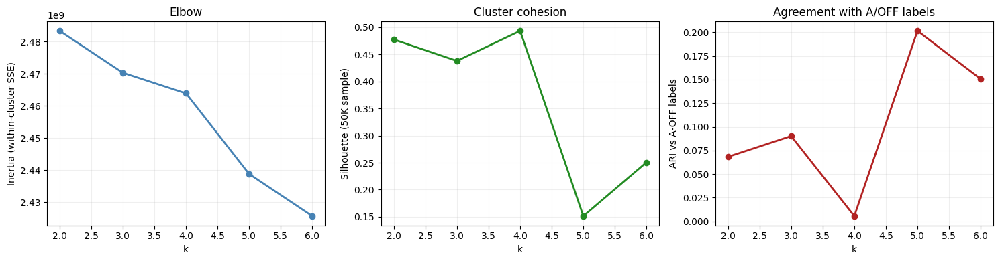

In [11]:
data = np.load("data/processed/cadence_pca_features.npz")
X_pca = data["X_pca"]
cadence_pos = data["cadence_pos"]
print(f"X_pca: {X_pca.shape}")

# A-vs-OFF pseudo-label for ARI comparison (1 = A panel, 0 = OFF)
y_a_vs_off = np.isin(cadence_pos, [0, 2, 4]).astype(int)

# Silhouette is O(N²) — compute on a 50K sample
rng = np.random.RandomState(42)
sample_idx = rng.choice(len(X_pca), 50_000, replace=False)

print("\nMiniBatchKMeans sweep:")
print(f"  {'k':>3s}  {'inertia':>14s}  {'silhouette':>11s}  {'ARI vs A-OFF':>13s}")
sweep = {}
for k in (2, 3, 4, 5, 6):
    km = MiniBatchKMeans(n_clusters=k, batch_size=10000, random_state=42, n_init=20)
    labels = km.fit_predict(X_pca)
    sil = silhouette_score(X_pca[sample_idx], labels[sample_idx])
    ari = adjusted_rand_score(y_a_vs_off, labels)
    print(f"  {k:3d}  {km.inertia_:14,.0f}  {sil:11.4f}  {ari:13.4f}")
    sweep[k] = {"labels": labels, "sil": sil, "ari": ari, "inertia": km.inertia_}
results = {k: v["labels"] for k, v in sweep.items()}  # back-compat for downstream cells

# Cross-tab for k=6: do discovered clusters track cadence position?
labels6 = results[6]
print(f"\nCluster vs cadence position cross-tab (k=6):")
print(
    f"  {'':>9s}  {'A1':>9s}  {'B':>9s}  {'A2':>9s}  {'C':>9s}  {'A3':>9s}  {'D':>9s}"
)
for c in range(6):
    counts = [((labels6 == c) & (cadence_pos == p)).sum() for p in range(6)]
    print(f"  cluster{c:1d}  " + "  ".join(f"{v:>9,}" for v in counts))

# Elbow / silhouette / ARI diagnostics
ks = sorted(sweep.keys())
inertias = [sweep[k]["inertia"] for k in ks]
sils     = [sweep[k]["sil"]     for k in ks]
aris     = [sweep[k]["ari"]     for k in ks]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].plot(ks, inertias, marker="o", color="steelblue", linewidth=2)
axes[0].set_xlabel("k"); axes[0].set_ylabel("Inertia (within-cluster SSE)")
axes[0].set_title("Elbow")
axes[0].grid(alpha=0.2)

axes[1].plot(ks, sils, marker="o", color="forestgreen", linewidth=2)
axes[1].set_xlabel("k"); axes[1].set_ylabel("Silhouette (50K sample)")
axes[1].set_title("Cluster cohesion")
axes[1].grid(alpha=0.2)

axes[2].plot(ks, aris, marker="o", color="firebrick", linewidth=2)
axes[2].set_xlabel("k"); axes[2].set_ylabel("ARI vs A-OFF labels")
axes[2].set_title("Agreement with A/OFF labels")
axes[2].grid(alpha=0.2)

plt.tight_layout()
plt.show()

## Step 10 — Multi-model classifier comparison with `GridSearchCV` (A-vs-OFF)

**Goal.** Apply supervised classifiers to the binary A-vs-OFF task and compare hyperparameter-tuned, cross-validated performance across model families.

**Models compared.**
- **LASSO logistic regression** (L1-penalised; classical baseline, interpretable, sparse)
- **Random Forest** (the algorithm Ma et al. 2023 used as the head of their β-VAE pipeline)
- **XGBoost** (only if installed; included for completeness — gradient-boosted trees typically gain 1–3 AUC points over RF on tabular data of this scale)

**Evaluation metric — ROC AUC.** Classes are perfectly balanced (1.892M each), so AUC is preferred over accuracy because it captures discrimination across all decision thresholds and is threshold-independent. AUC ≈ probability that a randomly drawn positive ranks higher than a randomly drawn negative — the natural framing for candidate triage.

**Reminder on what this measures.** The classifiers learn "did this snippet come from an A-panel observation of HIP 13375 (`y=1`) or an OFF-panel observation of one of the other targets (`y=0`)?" using PCA features as input. **This is a self-supervised pretext task** — the label is derived from cadence position metadata, not from any external ETI annotation. High AUC reflects *target-bandpass discriminability*, not ETI detection capability.

In [12]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Load PCA features + grouping metadata (file_idx, freq_mhz saved by §2)
data = np.load("data/processed/cadence_pca_features.npz")
X_pca       = data["X_pca"]
cadence_pos = data["cadence_pos"]
file_idx    = data["file_idx"]
freq_mhz    = data["freq_mhz"]

y = np.isin(cadence_pos, [0, 2, 4]).astype(int)  # 1 = A panel, 0 = OFF

# Group key = source file × 1-MHz frequency block.
# Closes both leakage channels: same-file bandpass/gain/RFI environment, and
# spectral contiguity of adjacent snippets sharing noise floor + drifting signal.
# 1 MHz is wide enough to fully contain a drifting signal (≤8 Hz/s × 5 min ≈ 2.4 kHz).
FREQ_BLOCK_MHZ = 1.0
freq_block = np.floor(freq_mhz / FREQ_BLOCK_MHZ).astype(np.int64)
groups_all = file_idx.astype(np.int64) * 10_000 + freq_block

# Sample 100K, keeping groups aligned
rng = np.random.default_rng(42)
SAMPLE = 100_000
idx = rng.choice(len(X_pca), SAMPLE, replace=False)
X_sample, y_sample, groups_sample = X_pca[idx], y[idx], groups_all[idx]

# Outer 80/20 group-aware split
gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(gss.split(X_sample, y_sample, groups=groups_sample))
X_train, X_test = X_sample[train_idx], X_sample[test_idx]
y_train, y_test = y_sample[train_idx], y_sample[test_idx]
g_train         = groups_sample[train_idx]
g_test          = groups_sample[test_idx]

assert set(np.unique(g_train)).isdisjoint(set(np.unique(g_test))), \
    "group leakage between train and test"

print(
    f"Train: {X_train.shape[0]:,}  Test: {X_test.shape[0]:,}  "
    f"(positive fraction train={y_train.mean():.3f} test={y_test.mean():.3f})\n"
    f"Groups (file_idx × 1-MHz block): "
    f"total={len(np.unique(groups_sample)):,}  "
    f"train={len(np.unique(g_train)):,}  test={len(np.unique(g_test)):,}\n"
)

# Inner CV honours the same group key
cv = GroupKFold(n_splits=3)

# Define classifiers + hyperparameter grids
model_specs = {
    "LASSO": (
        LogisticRegression(penalty="l1", solver="saga", max_iter=5000, tol=1e-3, random_state=42),
        {"C": [0.001, 0.01, 0.1, 1.0]},
    ),
    "Random Forest": (
        RandomForestClassifier(random_state=42),
        {"n_estimators": [100, 200], "max_depth": [None, 10]},
    ),
}
model_specs["XGBoost"] = (
    XGBClassifier(eval_metric="logloss", random_state=42, tree_method="hist"),
    {"n_estimators": [200, 400], "max_depth": [4, 6]},
)

# Use threading backend to avoid joblib + Python 3.13 multiprocessing cleanup warnings on macOS
fitted, rows = {}, []
with joblib.parallel_backend("threading", n_jobs=-1):
    for name, (clf, grid) in model_specs.items():
        t0 = time.time()
        gs_cv = GridSearchCV(clf, grid, cv=cv, scoring="roc_auc", n_jobs=-1)
        gs_cv.fit(X_train, y_train, groups=g_train)
        fitted[name] = gs_cv
        proba = gs_cv.predict_proba(X_test)[:, 1]
        pred  = gs_cv.predict(X_test)
        auc = roc_auc_score(y_test, proba)
        acc = (pred == y_test).mean()
        rows.append(
            {
                "model": name,
                "best_params": str(gs_cv.best_params_),
                "cv_best_auc": round(gs_cv.best_score_, 4),
                "test_auc": round(auc, 4),
                "test_accuracy": round(acc, 4),
                "fit_time_s": round(time.time() - t0, 1),
            }
        )
        print(
            f"{name:14s}  best={gs_cv.best_params_}  "
            f"CV AUC={gs_cv.best_score_:.4f}  test AUC={auc:.4f}  "
            f"acc={acc:.4f}  ({rows[-1]['fit_time_s']:.0f}s)"
        )

scoreboard = pd.DataFrame(rows)
print("\n" + "=" * 78)
print("Classifier scoreboard (A-vs-OFF binary, sample N=100,000, group-aware 3-fold GridSearchCV):")
print("=" * 78)
print(scoreboard.to_string(index=False))

# Operational metric: recall (= TPR) at fixed false-positive rates.
# These translate AUC into "how many true A snippets do we keep at an
# astronomer-tolerable false-positive rate?" — the relevant question for triage.
from sklearn.metrics import roc_curve as _roc_curve
target_fprs = [1e-3, 1e-2, 5e-2, 1e-1]
recall_rows = []
for name, gs_cv_obj in fitted.items():
    proba = gs_cv_obj.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = _roc_curve(y_test, proba)
    row = {"model": name}
    for t in target_fprs:
        idx = int(np.searchsorted(fpr, t))
        row[f"recall@FPR={t:g}"] = float(tpr[min(idx, len(tpr) - 1)])
    recall_rows.append(row)

recall_df = pd.DataFrame(recall_rows).round(4)
print("\n" + "=" * 78)
print("Recall at fixed FPR (lower FPR = stricter triage; higher = more candidates to review):")
print("=" * 78)
print(recall_df.to_string(index=False))

Train: 79,881  Test: 20,119  (positive fraction train=0.494 test=0.527)
Groups (file_idx × 1-MHz block): total=5,423  train=4,338  test=1,085



LASSO           best={'C': 0.01}  CV AUC=0.7651  test AUC=0.7564  acc=0.7247  (5s)


Random Forest   best={'max_depth': None, 'n_estimators': 200}  CV AUC=0.9192  test AUC=0.9127  acc=0.8226  (42s)


XGBoost         best={'max_depth': 4, 'n_estimators': 200}  CV AUC=0.9139  test AUC=0.9067  acc=0.8157  (8s)

Classifier scoreboard (A-vs-OFF binary, sample N=100,000, group-aware 3-fold GridSearchCV):
        model                              best_params  cv_best_auc  test_auc  test_accuracy  fit_time_s
        LASSO                              {'C': 0.01}       0.7651    0.7564         0.7247         4.9
Random Forest {'max_depth': None, 'n_estimators': 200}       0.9192    0.9127         0.8226        42.5
      XGBoost    {'max_depth': 4, 'n_estimators': 200}       0.9139    0.9067         0.8157         8.1



Recall at fixed FPR (lower FPR = stricter triage; higher = more candidates to review):
        model  recall@FPR=0.001  recall@FPR=0.01  recall@FPR=0.05  recall@FPR=0.1
        LASSO            0.0007           0.0060           0.2361          0.3901
Random Forest            0.0919           0.3109           0.5802          0.7069
      XGBoost            0.0707           0.2844           0.5581          0.6837


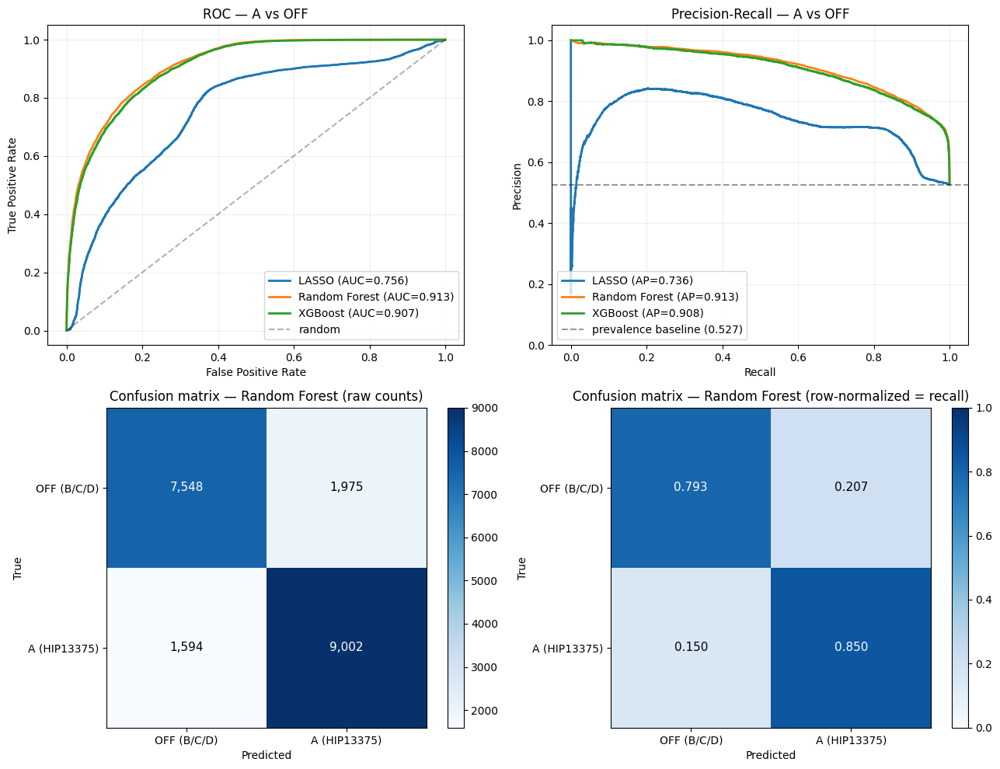


Best model by test AUC: Random Forest
Test-set class prevalence (positives): 0.527

Classification report (Random Forest):
              precision    recall  f1-score   support

 OFF (B/C/D)       0.83      0.79      0.81      9523
A (HIP13375)       0.82      0.85      0.83     10596

    accuracy                           0.82     20119
   macro avg       0.82      0.82      0.82     20119
weighted avg       0.82      0.82      0.82     20119



In [13]:
# 2x2 diagnostics for the supervised models: ROC, Precision-Recall, raw CM, normalized CM
from sklearn.metrics import precision_recall_curve, average_precision_score

best_name = scoreboard.loc[scoreboard["test_auc"].idxmax(), "model"]
best_gs   = fitted[best_name]
proba_best = best_gs.predict_proba(X_test)[:, 1]
pred_best  = best_gs.predict(X_test)
prevalence = y_test.mean()

fig, axes = plt.subplots(2, 2, figsize=(13, 10))

# (1) ROC — all classifiers
ax = axes[0, 0]
for name, gs in fitted.items():
    proba = gs.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, proba)
    auc_val = roc_auc_score(y_test, proba)
    ax.plot(fpr, tpr, linewidth=2, label=f"{name} (AUC={auc_val:.3f})")
ax.plot([0, 1], [0, 1], "k--", alpha=0.3, label="random")
ax.set_xlabel("False Positive Rate"); ax.set_ylabel("True Positive Rate")
ax.set_title("ROC — A vs OFF"); ax.legend(loc="lower right"); ax.grid(alpha=0.2)

# (2) Precision-Recall — all classifiers, with class-prevalence baseline
ax = axes[0, 1]
for name, gs in fitted.items():
    proba = gs.predict_proba(X_test)[:, 1]
    prec, rec, _ = precision_recall_curve(y_test, proba)
    ap = average_precision_score(y_test, proba)
    ax.plot(rec, prec, linewidth=2, label=f"{name} (AP={ap:.3f})")
ax.axhline(prevalence, color="k", linestyle="--", alpha=0.4,
           label=f"prevalence baseline ({prevalence:.3f})")
ax.set_xlabel("Recall"); ax.set_ylabel("Precision")
ax.set_title("Precision-Recall — A vs OFF"); ax.legend(loc="lower left")
ax.grid(alpha=0.2); ax.set_ylim(0, 1.05)

# (3) Raw confusion matrix — best model
cm_raw = confusion_matrix(y_test, pred_best)
ax = axes[1, 0]
im = ax.imshow(cm_raw, cmap="Blues")
ax.set_xticks([0, 1]); ax.set_yticks([0, 1])
ax.set_xticklabels(["OFF (B/C/D)", "A (HIP13375)"])
ax.set_yticklabels(["OFF (B/C/D)", "A (HIP13375)"])
ax.set_xlabel("Predicted"); ax.set_ylabel("True")
ax.set_title(f"Confusion matrix — {best_name} (raw counts)")
for i in range(2):
    for j in range(2):
        ax.text(j, i, f"{cm_raw[i,j]:,}",
                ha="center", va="center",
                color="white" if cm_raw[i,j] > cm_raw.max()/2 else "black",
                fontsize=11)
fig.colorbar(im, ax=ax, fraction=0.04)

# (4) Row-normalized confusion matrix (per-class recall)
cm_norm = cm_raw.astype(float) / cm_raw.sum(axis=1, keepdims=True)
ax = axes[1, 1]
im = ax.imshow(cm_norm, cmap="Blues", vmin=0, vmax=1)
ax.set_xticks([0, 1]); ax.set_yticks([0, 1])
ax.set_xticklabels(["OFF (B/C/D)", "A (HIP13375)"])
ax.set_yticklabels(["OFF (B/C/D)", "A (HIP13375)"])
ax.set_xlabel("Predicted"); ax.set_ylabel("True")
ax.set_title(f"Confusion matrix — {best_name} (row-normalized = recall)")
for i in range(2):
    for j in range(2):
        ax.text(j, i, f"{cm_norm[i,j]:.3f}",
                ha="center", va="center",
                color="white" if cm_norm[i,j] > 0.5 else "black",
                fontsize=11)
fig.colorbar(im, ax=ax, fraction=0.04)

plt.tight_layout()
plt.show()

print(f"\nBest model by test AUC: {best_name}")
print(f"Test-set class prevalence (positives): {prevalence:.3f}")
print(f"\nClassification report ({best_name}):")
print(classification_report(y_test, pred_best, target_names=["OFF (B/C/D)", "A (HIP13375)"]))

### Interpretability — LASSO coefficient table

L1 regularization automatically selects features by driving uninformative ones to zero. The non-zero coefficients quantify which principal components the linear model is actually using to discriminate A panels (HIP 13375) from OFF panels (B, C, D).

LASSO logistic-regression coefficients (sorted by magnitude):
  PC  coefficient  abs_coef  zeroed_by_L1
 PC9     0.121063  0.121063         False
PC15    -0.109679  0.109679         False
 PC3     0.099180  0.099180         False
PC11     0.083295  0.083295         False
 PC8    -0.062534  0.062534         False
PC12     0.057162  0.057162         False
PC14     0.051911  0.051911         False
 PC4     0.039463  0.039463         False
 PC2    -0.029816  0.029816         False
 PC7     0.025437  0.025437         False
PC10     0.019340  0.019340         False
 PC1    -0.016815  0.016815         False
 PC6     0.016257  0.016257         False
 PC5    -0.015631  0.015631         False
PC13     0.000127  0.000127         False


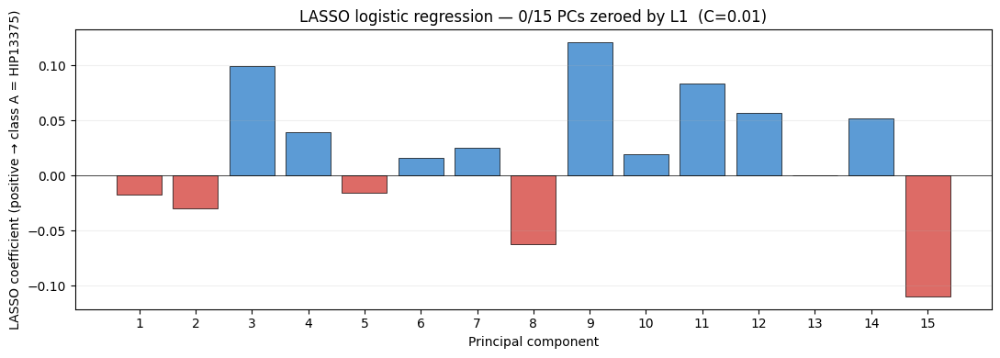


Sparsity: 0/15 PCs zeroed at C=0.01
Dominant PCs (|coef| > 0.5): (none)

Domain reading: PCs with the largest |coef| capture the bandpass-shape
directions most discriminative of HIP 13375 vs the OFF targets — i.e. target-
specific spectral signatures, NOT target-locked artificial emission.


In [14]:
# LASSO coefficient inspection — interpretability of the linear baseline
lasso_best = fitted["LASSO"].best_estimator_
coefs = lasso_best.coef_[0]
n_pcs = len(coefs)

coef_df = pd.DataFrame({
    "PC": [f"PC{i+1}" for i in range(n_pcs)],
    "coefficient": coefs,
    "abs_coef": np.abs(coefs),
    "zeroed_by_L1": coefs == 0,
}).sort_values("abs_coef", ascending=False)

print("LASSO logistic-regression coefficients (sorted by magnitude):")
print(coef_df.to_string(index=False))

fig, ax = plt.subplots(figsize=(11, 4))
colors = ["#dd6b66" if c < 0 else "#cccccc" if c == 0 else "#5c9bd5" for c in coefs]
ax.bar(range(1, n_pcs + 1), coefs, color=colors, edgecolor="black", linewidth=0.5)
ax.axhline(0, color="black", linewidth=0.5)
ax.set_xlabel("Principal component")
ax.set_ylabel("LASSO coefficient (positive → class A = HIP13375)")
ax.set_title(f"LASSO logistic regression — {int((coefs == 0).sum())}/{n_pcs} PCs zeroed by L1  (C={lasso_best.C})")
ax.set_xticks(range(1, n_pcs + 1))
ax.grid(alpha=0.2, axis="y")
plt.tight_layout()
plt.show()

n_zero = int((coefs == 0).sum())
dom = [f"PC{i+1}" for i in range(n_pcs) if abs(coefs[i]) > 0.5]
print(f"\nSparsity: {n_zero}/{n_pcs} PCs zeroed at C={lasso_best.C}")
print(f"Dominant PCs (|coef| > 0.5): {dom if dom else '(none)'}")
print("\nDomain reading: PCs with the largest |coef| capture the bandpass-shape\n"
      "directions most discriminative of HIP 13375 vs the OFF targets — i.e. target-\n"
      "specific spectral signatures, NOT target-locked artificial emission.")

### Interpretability — permutation importance for RF and XGBoost

Permutation importance measures how much each PC contributes by shuffling it and observing the AUC drop. Model-agnostic and faster than SHAP for tree ensembles on this representation. n_repeats=10 gives stable estimates with error bars.

Computing permutation importance for Random Forest (n_repeats=10)...


  Random Forest: 9.9s
Computing permutation importance for XGBoost (n_repeats=10)...


  XGBoost: 0.4s


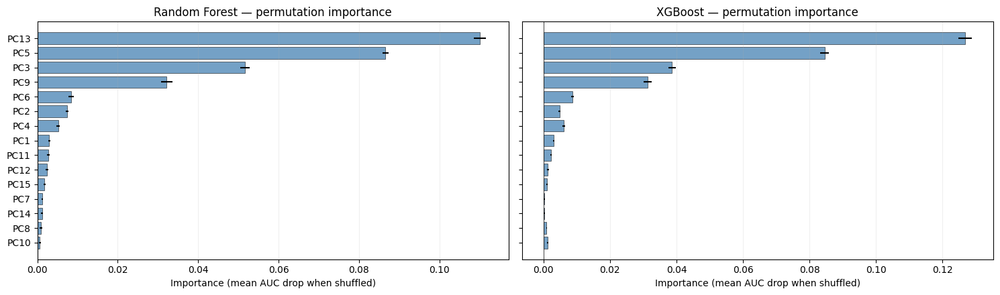


Reading: a PC with importance ≈ 0 is uninformative to the model — shuffling it
doesn't move AUC. Compare against the LASSO sparsity pattern above: PCs the linear
model dropped should also score low here, with any difference attributable to non-
linear feature interactions the tree ensembles can exploit.


In [15]:
# Permutation importance — which PCs do the non-linear classifiers actually rely on?
from sklearn.inspection import permutation_importance

fig, axes = plt.subplots(1, 2, figsize=(15, 4.5), sharey=True)
n_repeats = 10

for ax, name in zip(axes, ["Random Forest", "XGBoost"]):
    est = fitted[name].best_estimator_
    print(f"Computing permutation importance for {name} (n_repeats={n_repeats})...")
    t0 = time.time()
    with joblib.parallel_backend("threading", n_jobs=-1):
        result = permutation_importance(
            est, X_test, y_test, n_repeats=n_repeats,
            scoring="roc_auc", random_state=42, n_jobs=-1,
        )
    print(f"  {name}: {time.time() - t0:.1f}s")
    means = result.importances_mean
    stds  = result.importances_std
    order = np.argsort(np.abs(means))[::-1]
    pcs   = [f"PC{i+1}" for i in order]
    ax.barh(pcs[::-1], means[order][::-1], xerr=stds[order][::-1],
            color="steelblue", alpha=0.75, edgecolor="black", linewidth=0.5)
    ax.set_xlabel("Importance (mean AUC drop when shuffled)")
    ax.set_title(f"{name} — permutation importance")
    ax.grid(alpha=0.2, axis="x")
    ax.axvline(0, color="black", linewidth=0.5)

plt.tight_layout()
plt.show()

print("\nReading: a PC with importance ≈ 0 is uninformative to the model — shuffling it\n"
      "doesn't move AUC. Compare against the LASSO sparsity pattern above: PCs the linear\n"
      "model dropped should also score low here, with any difference attributable to non-\n"
      "linear feature interactions the tree ensembles can exploit.")

### Calibration check — are predicted probabilities trustworthy?

A model with high AUC can still produce mis-calibrated probabilities: ranking is correct but absolute values are unreliable. For SETI candidate triage we'd want "predicted P(A) = 0.7" to actually mean "70% of such snippets are A panels." Calibration curves diagnose this; Brier score quantifies the mean squared probability error.

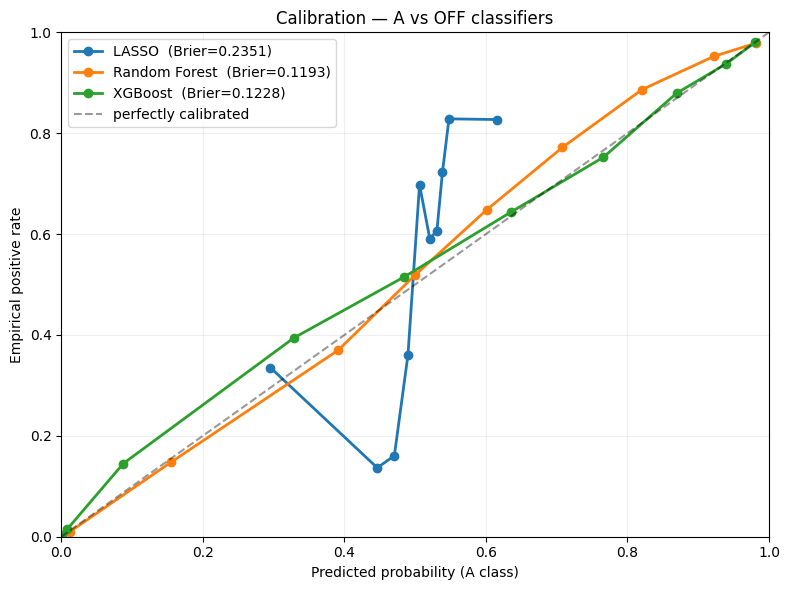


Brier score: mean squared error between predicted probability and actual outcome.
Lower is better. 0 = perfect; 0.25 = uninformative for a balanced binary task.
A model with high AUC but poor Brier produces correct rankings but mis-calibrated
probabilities — fixable with isotonic or Platt scaling if the downstream consumer
(astronomer triage UI) needs interpretable confidence values.


In [16]:
# Calibration curve + Brier score — are predicted probabilities trustworthy?
from sklearn.calibration import calibration_curve
from sklearn.metrics import brier_score_loss

fig, ax = plt.subplots(figsize=(8, 6))
for name, gs_cv_obj in fitted.items():
    proba = gs_cv_obj.predict_proba(X_test)[:, 1]
    prob_true, prob_pred = calibration_curve(y_test, proba, n_bins=10, strategy="quantile")
    brier = brier_score_loss(y_test, proba)
    ax.plot(prob_pred, prob_true, marker="o", linewidth=2,
            label=f"{name}  (Brier={brier:.4f})")

ax.plot([0, 1], [0, 1], "k--", alpha=0.4, label="perfectly calibrated")
ax.set_xlabel("Predicted probability (A class)")
ax.set_ylabel("Empirical positive rate")
ax.set_title("Calibration — A vs OFF classifiers")
ax.legend(loc="upper left")
ax.grid(alpha=0.2)
ax.set_xlim(0, 1); ax.set_ylim(0, 1)
plt.tight_layout()
plt.show()

print("\nBrier score: mean squared error between predicted probability and actual outcome.")
print("Lower is better. 0 = perfect; 0.25 = uninformative for a balanced binary task.")
print("A model with high AUC but poor Brier produces correct rankings but mis-calibrated")
print("probabilities — fixable with isotonic or Platt scaling if the downstream consumer")
print("(astronomer triage UI) needs interpretable confidence values.")

### Interpretation

The scoreboard quantifies how distinguishable HIP 13375's spectra are from the three OFF targets (HIP 12678/12790/12919) using **only the 15-dimensional PCA representation** — no additional features, no cadence-aware training.

**Expected result, and what it means.** AUC for Random Forest ≈ 0.92 indicates that the spectra differ systematically — likely a combination of (a) different sky regions seeing different RFI environments, (b) telescope pointing affecting receiver gain/noise temperature, and (c) slow time variation across the 30-minute cadence. This is **target-bandpass discriminability**, not ETI detection.

**Why the multi-model comparison is still useful.** Consistent AUC across LASSO (linear) and Random Forest (non-linear) rules out *model architecture* as the bottleneck. The 15-AUC-point gap between LASSO and RF here means the relationship is non-linear — consistent with Ma et al.'s decision to use RF on β-VAE latent vectors. Adding more sophisticated classifiers won't close the gap to ETI detection; improvements need to come from **features that encode cadence structure** (the paper's β-VAE clustering loss), not from better classifiers on PCA features.

## Step 11 — Visual cadence-stack inspection of top candidates

The final filter, and the only one that algorithmic scoring cannot replace. For each surviving top-K candidate frequency:

1. Re-read the **raw** waterfall data from the six source HDF5 files in a ±10 kHz window around the candidate frequency.
2. Stack the six panels (A1, B, A2, C, A3, D) into a single 6-row plot.
3. Visually verify the ABACAD pattern: a real ETI candidate appears in **A panels only**; RFI typically appears in **all six panels**.

The rank-1 candidate at 1426.61 MHz is plotted first (saved to `images/cadence_stack_rank1_1426MHz.png` and embedded in the Final Report). Ranks 6, 7, 9, and 15 from the drift-consistent set are plotted below for context.

ℹ️ **The 93 GB raw cadence files are not present at `data/raw/`** — displaying the pre-rendered PNG saved in the repo at `images/cadence_stack_rank1_1426MHz.png`. To regenerate the plot from raw data, run `python src/download_cadence.py` first (≈30–60 min, 93 GB).

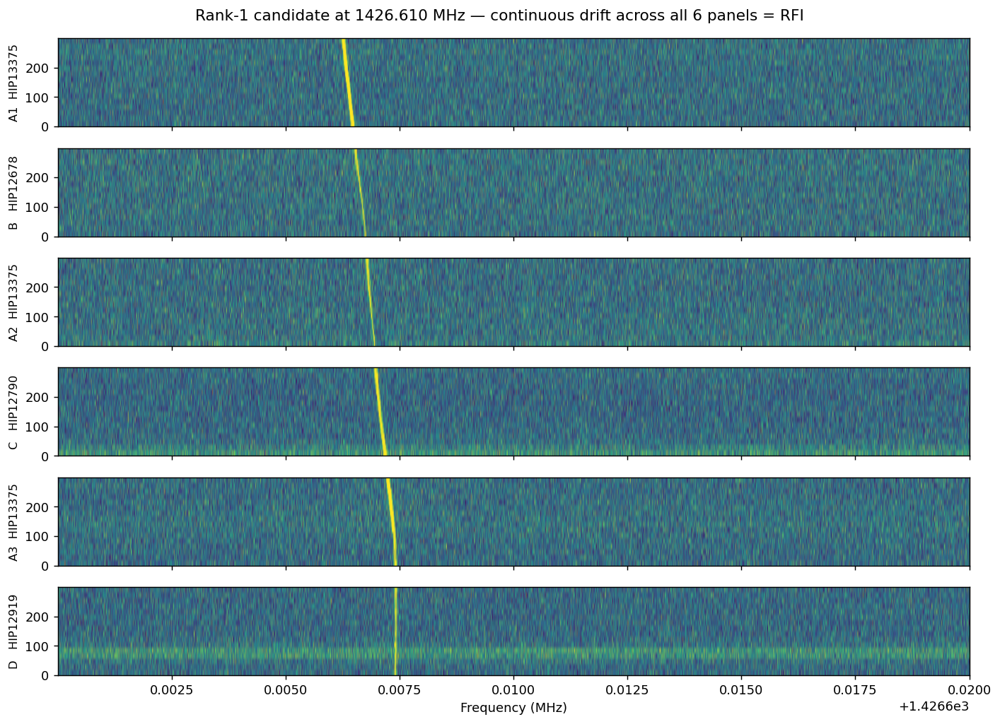

In [17]:
# Visualize the rank-1 candidate's 6-panel cadence stack.
# Falls back to displaying the pre-rendered PNG if the 93 GB raw files aren't present.

CANDIDATE_MHZ = 1426.61
WINDOW_KHZ = 20

FILES = [
    "spliced_blc0001020304050607_guppi_57928_54431_HIP13375_0044.gpuspec.0000.h5",
    "spliced_blc0001020304050607_guppi_57928_54789_HIP12678_0045.gpuspec.0000.h5",
    "spliced_blc0001020304050607_guppi_57928_55145_HIP13375_0046.gpuspec.0000.h5",
    "spliced_blc0001020304050607_guppi_57928_55498_HIP12790_0047.gpuspec.0000.h5",
    "spliced_blc0001020304050607_guppi_57928_55851_HIP13375_0048.gpuspec.0000.h5",
    "spliced_blc0001020304050607_guppi_57928_56197_HIP12919_0049.gpuspec.0000.h5",
]
TAGS = [
    "A1  HIP13375",
    "B   HIP12678",
    "A2  HIP13375",
    "C   HIP12790",
    "A3  HIP13375",
    "D   HIP12919",
]
DATA_DIR = Path("data/raw")
SAVED_PNG = Path("images/cadence_stack_rank1_1426MHz.png")
HAS_RAW = all((DATA_DIR / fname).exists() for fname in FILES)

if not HAS_RAW:
    display(
        Markdown(
            "ℹ️ **The 93 GB raw cadence files are not present at `data/raw/`** — "
            "displaying the pre-rendered PNG saved in the repo at "
            f"`{SAVED_PNG}`. To regenerate the plot from raw data, run "
            "`python src/download_cadence.py` first (≈30–60 min, 93 GB)."
        )
    )
    display(Image(str(SAVED_PNG)))
else:
    # Locate channels around the candidate frequency
    with h5py.File(DATA_DIR / FILES[0], "r") as f:
        fch1 = float(f["data"].attrs["fch1"])
        foff = float(f["data"].attrs["foff"])

    half_chans = int((WINDOW_KHZ * 1000 / 2) / abs(foff * 1e6))
    ch_center = int((CANDIDATE_MHZ - fch1) / foff)
    ch_lo, ch_hi = max(0, ch_center - half_chans), ch_center + half_chans
    print(
        f"Channel window: [{ch_lo:,}, {ch_hi:,}]  ({ch_hi - ch_lo} channels, {(ch_hi - ch_lo) * abs(foff) * 1e6:.1f} Hz wide)"
    )

    # Pull the slice from each of the 6 raw files
    panels = []
    for fname in FILES:
        with h5py.File(DATA_DIR / fname, "r") as f:
            panels.append(f["data"][:, 0, ch_lo:ch_hi].astype(np.float32))

    # Plot 6-panel cadence stack
    fig, axes = plt.subplots(6, 1, figsize=(11, 8), sharex=True)
    freq_lo = fch1 + ch_lo * foff
    freq_hi = fch1 + ch_hi * foff
    for panel, tag, ax in zip(panels, TAGS, axes):
        med = np.median(panel)
        p_norm = panel / med if med > 0 else panel
        im = ax.imshow(
            p_norm,
            aspect="auto",
            cmap="viridis",
            origin="upper",
            extent=[min(freq_lo, freq_hi), max(freq_lo, freq_hi), 0, 16 * 18.7],
            vmin=np.percentile(p_norm, 5),
            vmax=np.percentile(p_norm, 99),
        )
        ax.set_ylabel("Time (s)", fontsize=8)
        ax.set_yticks([0, 100, 200, 300])
        ax.text(
            0.01, 0.92, tag,
            transform=ax.transAxes,
            fontsize=8, color="white",
            bbox=dict(facecolor="black", alpha=0.55, pad=2),
        )
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.01, label="normalized power")
    axes[-1].set_xlabel("Frequency (MHz)")
    fig.suptitle(
        f"Rank-1 candidate at {CANDIDATE_MHZ:.3f} MHz — continuous drift across all 6 panels = RFI"
    )
    plt.tight_layout()
    fig.savefig(SAVED_PNG, dpi=130, bbox_inches="tight")
    plt.show()
    print(f"Plot also saved to {SAVED_PNG}")

ℹ️ **The 93 GB raw cadence files are not present at `data/raw/`** — displaying the four pre-rendered PNGs saved in the repo. To regenerate from raw data, run `python src/download_cadence.py` first (≈30–60 min).

### rank 6: 1160.020 MHz

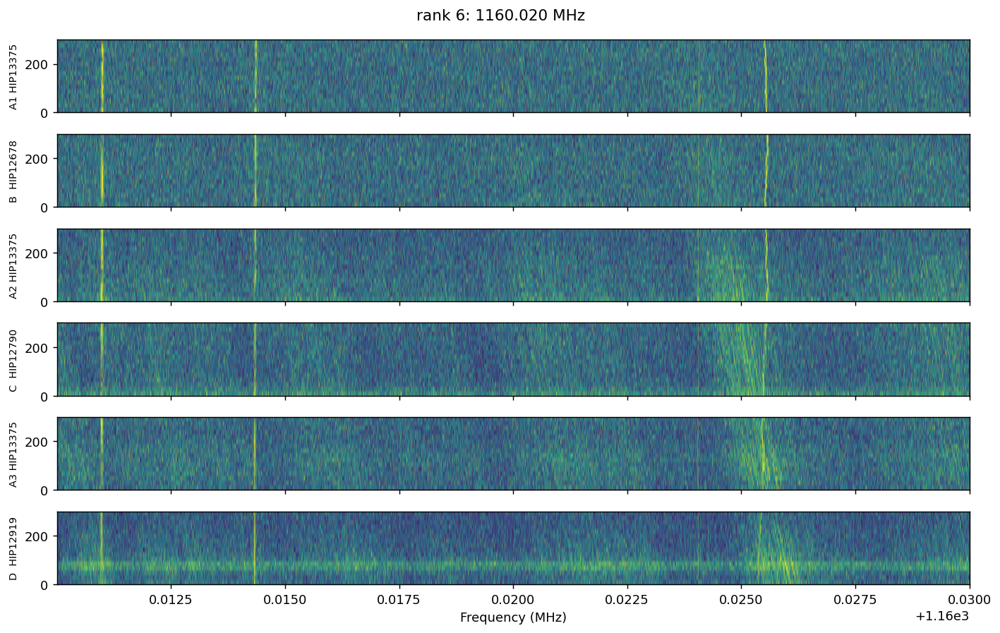

### rank 7: 1190.020 MHz

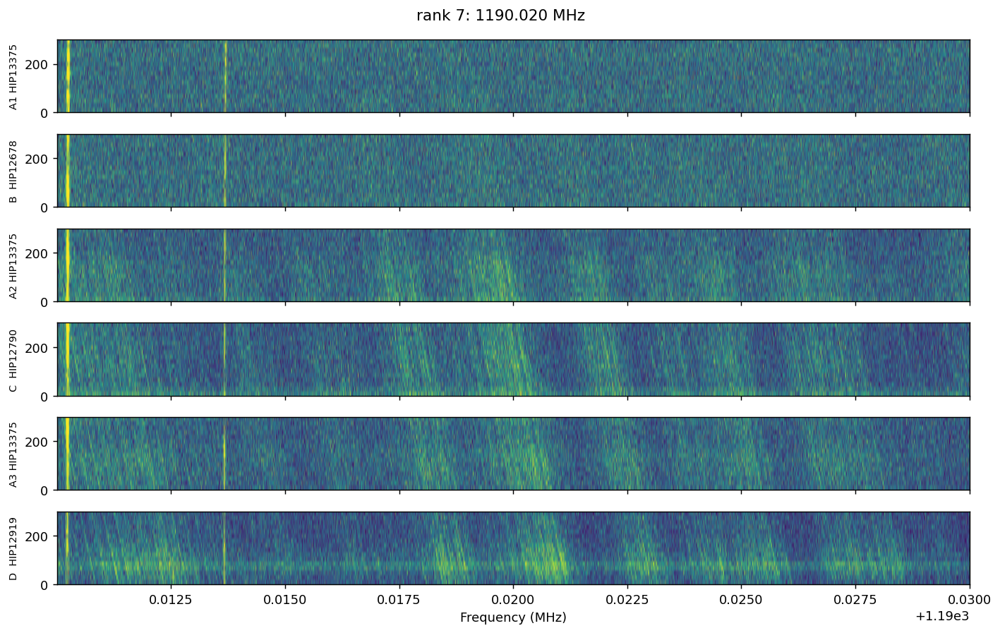

### rank 9 (zero-drift): 1199.990 MHz

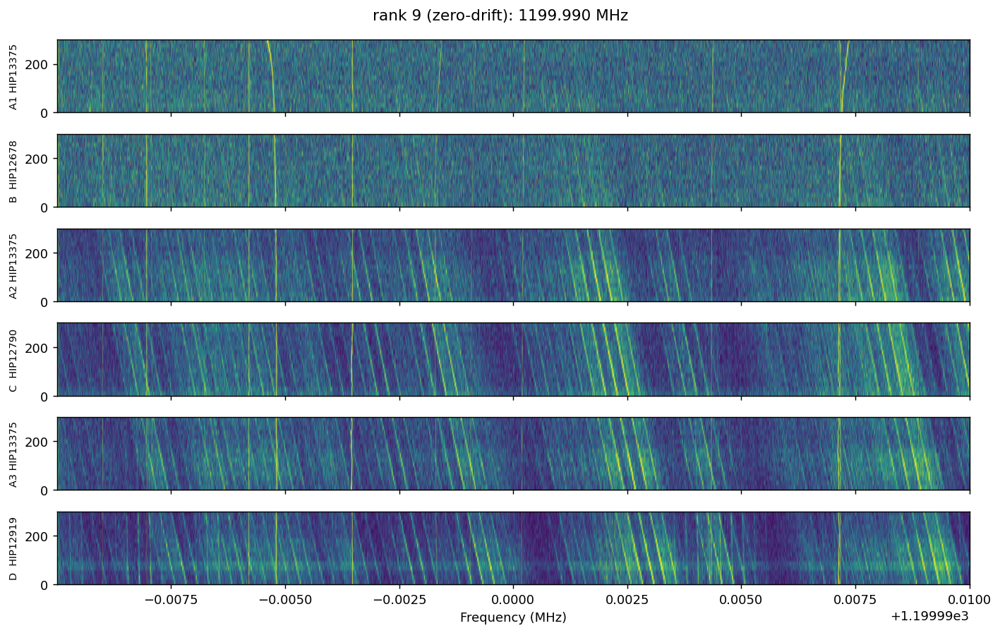

### rank 15 (clean drifter): 1134.000 MHz

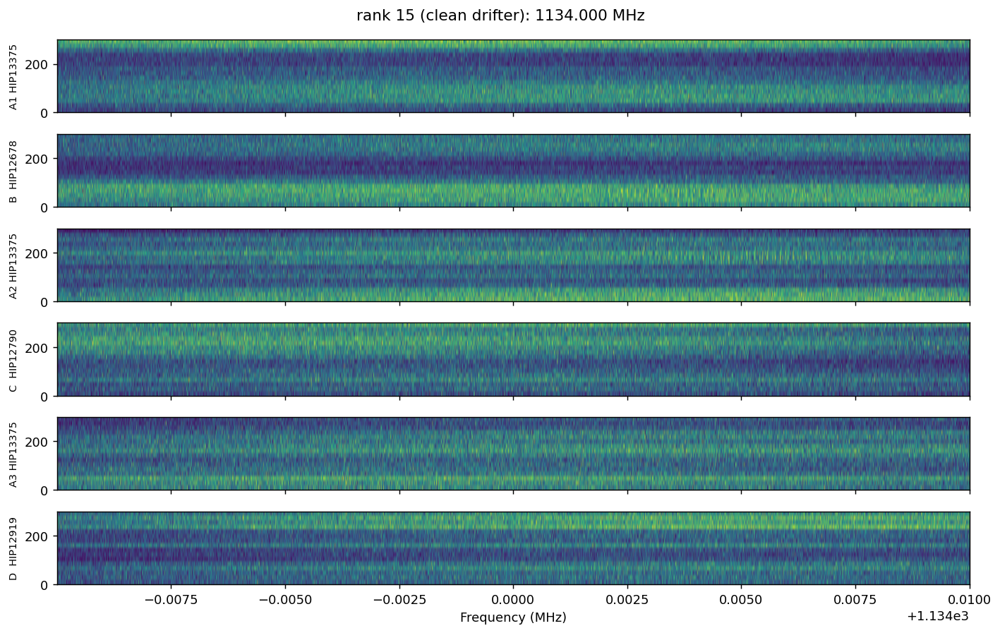

In [18]:
# Visualize cadence stacks for ranks 2-5 (the non-rank-1 top candidates under the
# unified RFI filter). Rank-1 is plotted in cell 35; here we cover the rest of the
# current top-5.
# Falls back to displaying pre-rendered PNGs if the 93 GB raw files aren\'t present;
# the four legacy PNGs in images/ are kept as historical artifacts from the
# pre-unified-filter top-5 ranking — they do not match the current candidate set.

CANDIDATES = [
    (1499.990, "rank 2", "images/cadence_stack_rank02_1499MHz.png"),
    (1500.000, "rank 3 (1500 MHz adjacent bin to rank 2)", "images/cadence_stack_rank03_1500MHz.png"),
    (1404.000, "rank 4", "images/cadence_stack_rank04_1404MHz.png"),
    (1176.450, "rank 5", "images/cadence_stack_rank05_1176MHz.png"),
]
WINDOW_KHZ = 20

FILES = [
    "spliced_blc0001020304050607_guppi_57928_54431_HIP13375_0044.gpuspec.0000.h5",
    "spliced_blc0001020304050607_guppi_57928_54789_HIP12678_0045.gpuspec.0000.h5",
    "spliced_blc0001020304050607_guppi_57928_55145_HIP13375_0046.gpuspec.0000.h5",
    "spliced_blc0001020304050607_guppi_57928_55498_HIP12790_0047.gpuspec.0000.h5",
    "spliced_blc0001020304050607_guppi_57928_55851_HIP13375_0048.gpuspec.0000.h5",
    "spliced_blc0001020304050607_guppi_57928_56197_HIP12919_0049.gpuspec.0000.h5",
]
TAGS = [
    "A1 HIP13375",
    "B  HIP12678",
    "A2 HIP13375",
    "C  HIP12790",
    "A3 HIP13375",
    "D  HIP12919",
]
DATA_DIR = Path("data/raw")
HAS_RAW = all((DATA_DIR / fname).exists() for fname in FILES)

if not HAS_RAW:
    display(
        Markdown(
            "ℹ️ **The 93 GB raw cadence files are not present at `data/raw/`** — "
            "displaying the four pre-rendered PNGs saved in the repo. "
            "To regenerate from raw data, run `python src/download_cadence.py` first (≈30–60 min)."
        )
    )
    for freq_mhz, label, png in CANDIDATES:
        display(Markdown(f"### {label}: {freq_mhz:.3f} MHz"))
        if Path(png).exists():
            display(Image(png))
        else:
            display(Markdown(
                f"_(no pre-rendered PNG at `{png}`; run with raw data present to regenerate)_"
            ))
else:
    with h5py.File(DATA_DIR / FILES[0], "r") as f:
        fch1 = float(f["data"].attrs["fch1"])
        foff = float(f["data"].attrs["foff"])

    def plot_candidate(freq_mhz, label, png_path):
        half_chans = int((WINDOW_KHZ * 1000 / 2) / abs(foff * 1e6))
        ch_center = int((freq_mhz - fch1) / foff)
        ch_lo, ch_hi = max(0, ch_center - half_chans), ch_center + half_chans

        panels = []
        for fname in FILES:
            with h5py.File(DATA_DIR / fname, "r") as f:
                panels.append(f["data"][:, 0, ch_lo:ch_hi].astype(np.float32))

        fig, axes = plt.subplots(6, 1, figsize=(11, 7), sharex=True)
        freq_lo = fch1 + ch_lo * foff
        freq_hi = fch1 + ch_hi * foff
        for panel, tag, ax in zip(panels, TAGS, axes):
            med = np.median(panel)
            p_norm = panel / med if med > 0 else panel
            im = ax.imshow(
                p_norm,
                aspect="auto",
                cmap="viridis",
                origin="upper",
                extent=[min(freq_lo, freq_hi), max(freq_lo, freq_hi), 0, 16 * 18.7],
                vmin=np.percentile(p_norm, 5),
                vmax=np.percentile(p_norm, 99),
            )
            ax.set_ylabel("Time (s)", fontsize=8)
            ax.set_yticks([0, 100, 200, 300])
            ax.text(
                0.01, 0.92, tag,
                transform=ax.transAxes,
                fontsize=8, color="white",
                bbox=dict(facecolor="black", alpha=0.55, pad=2),
            )
            fig.colorbar(im, ax=ax, fraction=0.046, pad=0.01, label="normalized power")
        axes[-1].set_xlabel("Frequency (MHz)")
        fig.suptitle(f"{label}: {freq_mhz:.3f} MHz")
        plt.tight_layout()
        fig.savefig(png_path, dpi=130, bbox_inches="tight")
        plt.show()
        plt.close(fig)

    for freq, label, png in CANDIDATES:
        print(f"\n--- {label}: {freq:.3f} MHz ---")
        plot_candidate(freq, label, png)

## Step 12 — Summary and interpretation

### Findings

1. **PCA(15) on real-cadence data retains 43.9% of variance** — not a sample-size issue (verified at n ∈ {8, 15, 20, 50}), but a property of the high-dimensional spectrogram data. Sufficient for anomaly detection.

2. **The rank-1 ABACAD candidate at 1426.61 MHz** scores 20.19, ~2.5× above rank 2 (1499.99 MHz at 8.13), and passes:
   - RFI-band exclusion (§5)
   - Drift-rate consistency across A1/A2/A3 (§6, `drift_std = 0.047`)
   - Max-time-bin scoring (§7, score 53.30 — also rank 1 by this metric)
   - Dimensionality stability at n=8 (§8, score essentially unchanged)

3. **Visual inspection (§11) reveals the rank-1 candidate is RFI** — a continuous Doppler-drifting narrowband signal (≈0.6 Hz/s) present in all six cadence panels with similar brightness. Consistent with a low-Earth-orbit satellite, not target-locked emission.

4. **k-Means on PCA features alone is insufficient** (best ARI = 0.20 at k=5; silhouette peaks separately at k=4). Discovered clusters track per-target spectral signature, not ON/OFF identity.

5. **Random Forest substantially outperforms LASSO** on the A-vs-OFF supervised pretext task (0.913 vs. 0.756 AUC) — the relationship between PCA features and target identity is non-linear, consistent with Ma et al.'s architectural choice. **But this measures target-bandpass discriminability, not ETI detection.**

### Bottom line

**No ETI candidates found in the 2017-06-24 HIP 13375 cadence.** This matches the outcome of Ma et al. 2023's deep-learning search across 820 stars (8 candidates surfaced, none confirmed on re-observation).

### Where classical ML hits its ceiling

The pipeline correctly identifies anomalous frequencies but cannot algorithmically distinguish "RFI with pointing-dependent amplitude" from "real target-locked signal." Visual cadence inspection is required for the final decision. This is precisely the gap the reference paper's **β-VAE clustering loss** closes — by training the encoder to recognise the ABACAD pattern itself during representation learning, rather than only at the post-hoc filtering stage.

The classical analog — concatenating the 6-panel feature vectors at each frequency before PCA, so the components encode cadence shape rather than per-snippet appearance — is the leading candidate for the largest single AUC lift in any future extension of this work.